# Evaluation Project - 1
Baseball Case Study
Problem Statement:
This dataset utilizes data from 2014 Major League Baseball seasons in order to develop an algorithm that predicts the number of wins for a given team in the 2015 season based on several different indicators of success. There are 16 different features that will be used as the inputs to the machine learning and the output will be a value that represents the number of wins. 

-- Input features: Runs, At Bats, Hits, Doubles, Triples, Homeruns, Walks, Strikeouts, Stolen Bases, Runs Allowed, Earned Runs, Earned Run Average (ERA), Shutouts, Saves, Complete Games and Errors

-- Output: Number of predicted wins (W)

To understand the columns meaning, follow the link given below to understand the baseball statistics: https://en.wikipedia.org/wiki/Baseball_statistics

For downloading the dataset, use the link given below. 

Downlaod Files:
https://github.com/dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/baseball.csv

Importing libraries for EDA, Data Wrangling,Data cleaning

In [1]:
import pandas as pd # for data wrangling purpose
import numpy as np # Basic computation library
import seaborn as sns # For Visualization 
import matplotlib.pyplot as plt # ploting package
%matplotlib inline
import warnings # Filtering warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('Baseball.csv')

In [3]:
df

,W,R,AB,H,2B,3B,HR,BB,SO,SB,RA,ER,ERA,CG,SHO,SV,E
0,95,724,5575,1497,300,42,139,383,973,104,641,601,3.73,2,8,56,88
1,83,696,5467,1349,277,44,156,439,1264,70,700,653,4.07,2,12,45,86
2,81,669,5439,1395,303,29,141,533,1157,86,640,584,3.67,11,10,38,79
3,76,622,5533,1381,260,27,136,404,1231,68,701,643,3.98,7,9,37,101
4,74,689,5605,1515,289,49,151,455,1259,83,803,746,4.64,7,12,35,86
5,93,891,5509,1480,308,17,232,570,1151,88,670,609,3.80,7,10,34,88
6,87,764,5567,1397,272,19,212,554,1227,63,698,652,4.03,3,4,48,93
7,81,713,5485,1370,246,20,217,418,1331,44,693,646,4.05,0,10,43,77
8,80,644,5485,1383,278,32,167,436,1310,87,642,604,3.74,1,12,60,95
9,78,748,5640,1495,294,33,161,478,1148,71,753,694,4.31,3,10,40,97


In [5]:
print('Number of rows',df.shape[0])
print('Number of column',df.shape[1])
df.head(10)

Number of rows 30
Number of column 17


,W,R,AB,H,2B,3B,HR,BB,SO,SB,RA,ER,ERA,CG,SHO,SV,E
0,95,724,5575,1497,300,42,139,383,973,104,641,601,3.73,2,8,56,88
1,83,696,5467,1349,277,44,156,439,1264,70,700,653,4.07,2,12,45,86
2,81,669,5439,1395,303,29,141,533,1157,86,640,584,3.67,11,10,38,79
3,76,622,5533,1381,260,27,136,404,1231,68,701,643,3.98,7,9,37,101
4,74,689,5605,1515,289,49,151,455,1259,83,803,746,4.64,7,12,35,86
5,93,891,5509,1480,308,17,232,570,1151,88,670,609,3.80,7,10,34,88
6,87,764,5567,1397,272,19,212,554,1227,63,698,652,4.03,3,4,48,93
7,81,713,5485,1370,246,20,217,418,1331,44,693,646,4.05,0,10,43,77
8,80,644,5485,1383,278,32,167,436,1310,87,642,604,3.74,1,12,60,95
9,78,748,5640,1495,294,33,161,478,1148,71,753,694,4.31,3,10,40,97


Comments:

The data contains 16 features which contain the statical figure of baseball players.

W(win):the target variable which predict the wins

The 16 features are: Runs, At Bat, Hits, Doubles, Triples, Home Runs, Walks, Strikeouts, Stolen Bases, Runs Allowed, Earned Runs, Earned Run Average, Shutouts, Saves, Complete Games and Errors

In [7]:
df.columns

Index(['W', 'R', 'AB', 'H', '2B', '3B', 'HR', 'BB', 'SO', 'SB', 'RA', 'ER',
       'ERA', 'CG', 'SHO', 'SV', 'E'],
      dtype='object')

The column names present in our data set is not making much sense and will need to be converted into understandable format. In order to gain understanding of different columns in dataset, following baseball stastics terminology I get from Wikipedia.

#### Pitching statistics:

W – Win: number of games where pitcher was pitching while their team took the lead and went on to win, also the starter needs to pitch at least 5 innings of work

RA – Run average: number of runs allowed times nine divided by innings pitched

ER – Earned run: number of runs that did not occur as a result of errors or passed balls

ERA – Earned run average: total number of earned runs (see "ER" above), multiplied by 9, divided by innings pitched

CG – Complete game: number of games where player was the only pitcher for their team

SHO – Shutout: number of complete games pitched with no runs allowed. A starting pitcher is credited with a shutout when he pitches the entire game for a team and does not allow the opposition to score. By definition, any pitcher who throws a shutout is also awarded a win.

SV – Save: number of games where the pitcher enters a game led by the pitcher's team, finishes the game without surrendering the lead, is not the winning pitcher, and either (a) the lead was three runs or fewer when the pitcher entered the game; (b) the potential tying run was on base, at bat, or on deck; or (c) the pitcher pitched three or more innings

#### Batting statistics:

R – Runs scored: number of times a player crosses home plate

AB – At bat: plate appearances, not including bases on balls, being hit by pitch, sacrifices, interference, or obstruction. The number of times in which the hitter appeared at the plate and made a base hit, reached base on an error, or was out.

H – Hit: reaching base because of a batted, fair ball without error by the defense

2B – Double: hits on which the batter reaches second base safely without the contribution of a fielding error

3B – Triple: hits on which the batter reaches third base safely without the contribution of a fielding error

HR – Home runs: hits on which the batter successfully touched all four bases, without the contribution of a fielding error

BB – Base on balls (also called a "walk"): hitter not swinging at four pitches called out of the strike zone and awarded first base.A walk (or base on balls) occurs when a pitcher throws four pitches out of the strike zone, none of which are swung at by the hitter. After refraining from swinging at four pitches out of the zone, the batter is awarded first base.

K – Strike out (also abbreviated SO): number of times that a third strike is taken or swung at and missed, or bunted foul. Catcher must catch the third strike or batter may attempt to run to first base. It usually means the batter is out.
#### Base running statistics:

SB – Stolen base: number of bases advanced by the runner while the ball is in the possession of the defense.A stolen base occurs when a baserunner advances by taking a base to which he isn't entitled. This generally occurs when a pitcher is throwing a pitch, but it can also occur while the pitcher still has the ball or is attempting a pickoff, or as the catcher is throwing the ball back to the pitcher.

R – Runs scored: times reached home plate legally and safely
#### Fielding statistics:

E – Errors: number of times a fielder fails to make a play he should have made with common effort, and the offense benefits as a result. An error is an act, in the judgment of the official scorer, of a fielder misplaying a ball in a manner that allows a batter or baserunner to advance one or more bases or allows a plate appearance to continue after the batter should have been put out.
Now that we have clearer understanding on what the abbreviation mean and In order to simplify we are going to rename columns in dataset.

In [17]:
df.rename(columns={ 'W' : 'Wins',
                    'R' : 'Runs Scored',
                   'AB' : 'At Bat',
                   'H'  : 'Hits',
                   '2B' : 'Doubles',
                   '3B' : 'Triples',
                   'HR' : 'Home Runs',
                   'BB' : 'Base On Balls',
                   'SO' : 'Strike Outs',
                   'SB' : 'Stolen Base',
                   'RA' :  'Run Average',
                   'ER' :  'Earned Runs',
                   'ERA':  'Earned Run Average',
                   'CG' :  'Complete Games',
                   'SHO':  'Shot Outs',
                   'SV' :  'Saves',
                   'E'  : 'Errors'},inplace=True)
df.head()

,Wins,Runs Scored,At Bat,Hits,Doubles,Triples,Home Runs,Base On Balls,Strike Outs,Stolen Base,Run Average,Earned Runs,Earned Run Average,Complete Games,Shot Outs,Saves,Errors
0,95,724,5575,1497,300,42,139,383,973,104,641,601,3.73,2,8,56,88
1,83,696,5467,1349,277,44,156,439,1264,70,700,653,4.07,2,12,45,86
2,81,669,5439,1395,303,29,141,533,1157,86,640,584,3.67,11,10,38,79
3,76,622,5533,1381,260,27,136,404,1231,68,701,643,3.98,7,9,37,101
4,74,689,5605,1515,289,49,151,455,1259,83,803,746,4.64,7,12,35,86


In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30 entries, 0 to 29
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Wins                30 non-null     int64  
 1   Runs Scored         30 non-null     int64  
 2   At Bat              30 non-null     int64  
 3   Hits                30 non-null     int64  
 4   Doubles             30 non-null     int64  
 5   Triples             30 non-null     int64  
 6   Home Runs           30 non-null     int64  
 7   Base On Balls       30 non-null     int64  
 8   Strike Outs         30 non-null     int64  
 9   Stolen Base         30 non-null     int64  
 10  Run Average         30 non-null     int64  
 11  Earned Runs         30 non-null     int64  
 12  Earned Run Average  30 non-null     float64
 13  Complete Games      30 non-null     int64  
 14  Shot Outs           30 non-null     int64  
 15  Saves               30 non-null     int64  
 16  Errors    

observation:

we can see the dataset all the values is numerical and no value is categorical.

so we will do regression analysis

In [21]:
df.duplicated().sum()

0

# Objective :

Developing an ML Regression based algorithm that predicts the number of wins for a given team based on features. Here Wins is target variable and others are Input features

# Statistical Analysis:

<AxesSubplot:>

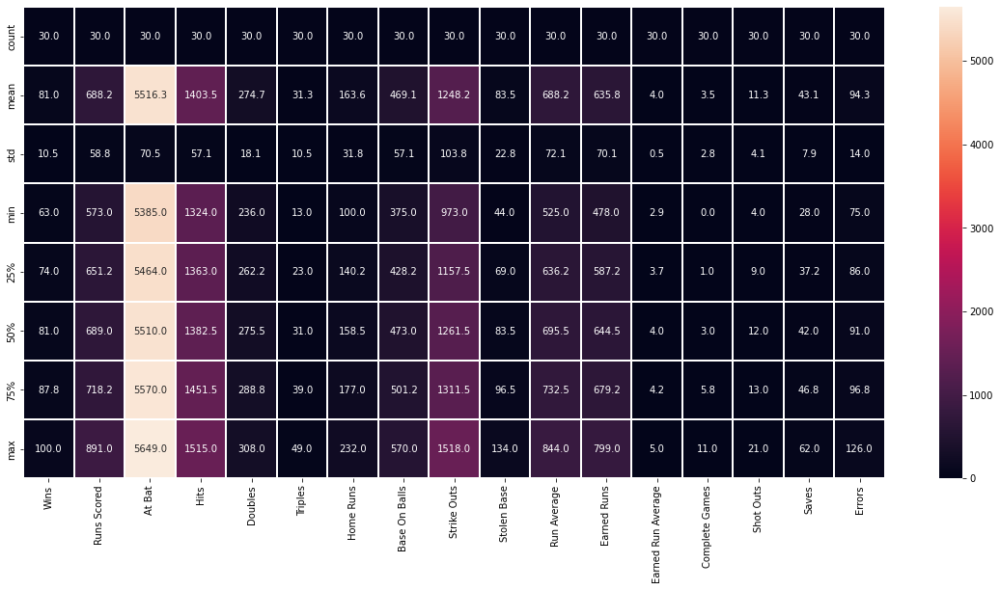

In [25]:
#visualising using the heatmap
plt.figure(figsize=(20,9))
sns.heatmap(df.describe(),linewidths=0.1,fmt='0.1f',annot=True)

In [28]:
df.describe().T #just using transpose for better understanding 

,count,mean,std,min,25%,50%,75%,max
Wins,30.0,80.966667,10.453455,63.00,74.0000,81.000,87.75,100.00
Runs Scored,30.0,688.233333,58.761754,573.00,651.2500,689.000,718.25,891.00
At Bat,30.0,5516.266667,70.467372,5385.00,5464.0000,5510.000,5570.00,5649.00
Hits,30.0,1403.533333,57.140923,1324.00,1363.0000,1382.500,1451.50,1515.00
Doubles,30.0,274.733333,18.095405,236.00,262.2500,275.500,288.75,308.00
Triples,30.0,31.300000,10.452355,13.00,23.0000,31.000,39.00,49.00
Home Runs,30.0,163.633333,31.823309,100.00,140.2500,158.500,177.00,232.00
Base On Balls,30.0,469.100000,57.053725,375.00,428.2500,473.000,501.25,570.00
Strike Outs,30.0,1248.200000,103.759470,973.00,1157.5000,1261.500,1311.50,1518.00
Stolen Base,30.0,83.500000,22.815225,44.00,69.0000,83.500,96.50,134.00


Comment -

If we just look at mean and 50% columns for different feature we can see data is sightly right skew for most of features.

Count is same for each variable.

75% and max values for Errors, Shutout, Run Scored shows presence of possible outliers.

Overall all statstical parameter from mean to max, indicate features are seem to be progressing in a definite manner showing no visible abnormalities.

Heatmap clearly shows data need to scale while building ML Model.


Now, checking missing values.

<AxesSubplot:>

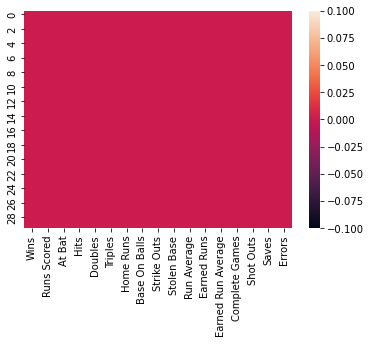

In [29]:
sns.heatmap(df.isnull())

clearly we can see no null value.

In [30]:
missing_values = df.isnull().sum().sort_values(ascending = False)
percentage_missing_values =(missing_values/len(df))*100
print(pd.concat([missing_values, percentage_missing_values], axis =1, keys =['Missing Values', '% Missing data']))

                    Missing Values  % Missing data
Wins                             0             0.0
Stolen Base                      0             0.0
Saves                            0             0.0
Shot Outs                        0             0.0
Complete Games                   0             0.0
Earned Run Average               0             0.0
Earned Runs                      0             0.0
Run Average                      0             0.0
Strike Outs                      0             0.0
Runs Scored                      0             0.0
Base On Balls                    0             0.0
Home Runs                        0             0.0
Triples                          0             0.0
Doubles                          0             0.0
Hits                             0             0.0
At Bat                           0             0.0
Errors                           0             0.0


## EDA 

Features which are contributing to win we will look into that

# Distribution Of Features

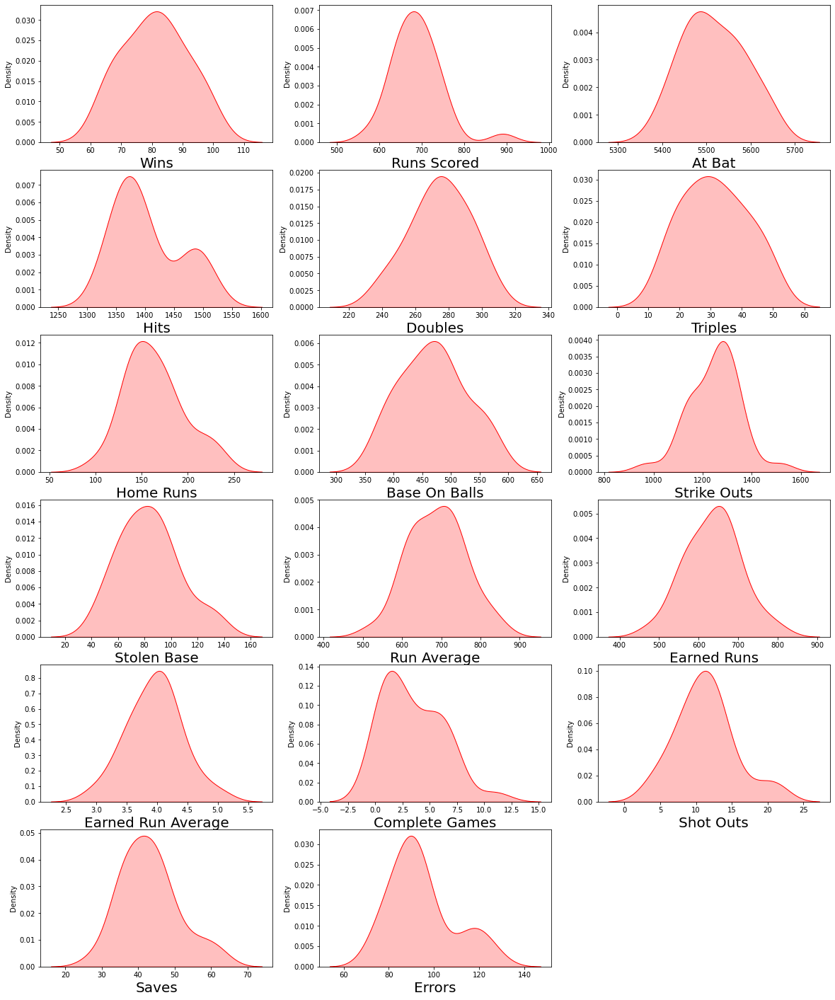

In [38]:
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in df:
    if plotnumber <= 17:
        ax=plt.subplot(6,3,plotnumber)
        sns.distplot(df[column], color='r',hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=20)
    plotnumber=plotnumber+1

plt.show()

We can see with the figure some features is left skewed and some are right.

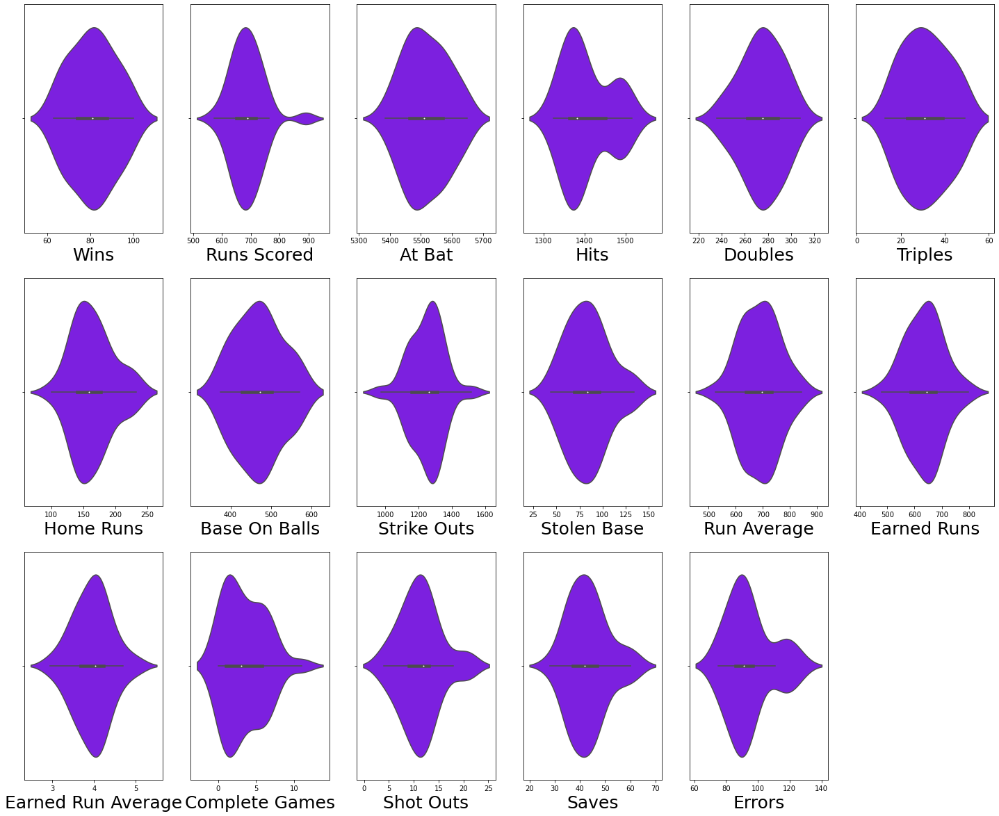

In [42]:
sns.set_palette('gist_rainbow_r')
plt.figure(figsize=(25,35),facecolor=('white'))
plotnumber=1
for column in df:
    if plotnumber <=17:
        ax=plt.subplot(5,6,plotnumber)
        sns.violinplot(df[column])
        plt.xlabel(column,fontsize=25)
    plotnumber=plotnumber+1
plt.show()

#### Comment -

Shut outs and Complete Game occur rarely which we can see in violinplot.

Most of saves are between 30 & 50. Saves doesnot entitle pitcher as wining pitcher but still it bring wins for team.It will be interesting what relation wins and save held.

Run average, Earned run and Earned run average are important for pitcher statstics. We can see there is not much difference, so from here we can conclude that Unearned Run doesnot make much difference in wins.

Homeruns (125 to 175 peak) are more than triples (20 to 40 majority) and triples is occuring in very less number as compared to doubles also.

As we know pitcher try to keep Earned run Average low which eventually lead to wins. Here for most of game ERA is around 3.5-4.5.

Let consider violinplot of doubles and base on balls. We know that if pitcher pitched ball for consecutive 4 ball then Base is awarded to batter. Clearly More runs comes from base of ball than doubles.

## Rules for win

To win in baseball, you must reach the end of the game with more runs than your opponent. If you have the same amount of runs, you will go into another inning until one team has more runs at the end of the inning.
Runs Vs Hits

Runs (R) - The number of runs scored by that player, by reaching home base in any manner.
Hits (H) - The number of base hits made by that player, not including reaching base on an error or on a "fielder's choice".


## Multivariate Analysis

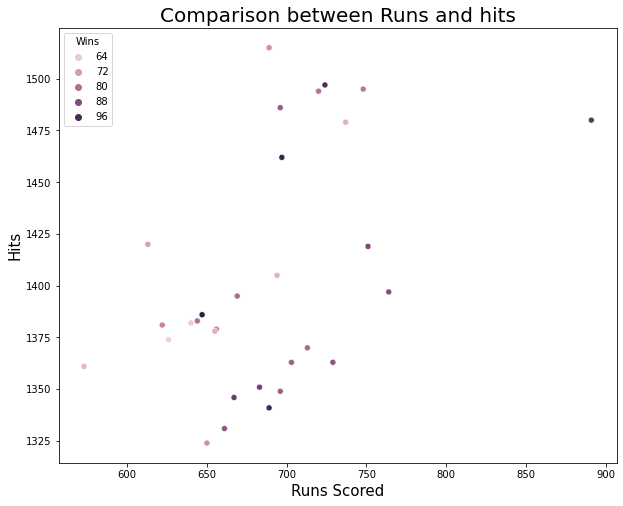

In [45]:
plt.figure(figsize=(10,8))
plt.title('Comparison between Runs and hits',fontsize=20)
sns.scatterplot(df['Runs Scored'],df['Hits'],hue=df['Wins'])
plt.xlabel('Runs Scored',fontsize=15)
plt.ylabel('Hits',fontsize=15)
plt.show()

Most win lies if run scored lies between 650 and 750, hit between 1325 to 1425

There is very less chance of win if runs scored is below 650 and hits below 1350

we can see there one point whose runs scored is more than 875 and hits is 1475, it may be outliers but we cant neglet them as we are working on less data and it can affect the ml

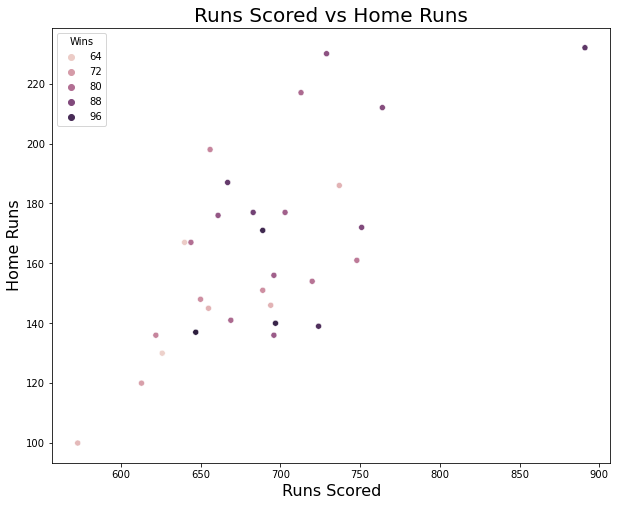

In [54]:
plt.figure(figsize=(10,8))
plt.title('Runs Scored vs Home Runs',fontsize=20 )
sns.scatterplot(df['Runs Scored'],df['Home Runs'],hue=df['Wins'])
plt.xlabel('Runs Scored',fontsize=16)
plt.ylabel('Home Runs',fontsize=16)
plt.show()

Here we can see if run score range is 650 to 750, it include home rum of 140 to 180 the win is around 90

we can see two point one is between 100 home runs and less than 600 run scored and one with more than 220 run score and 875 scored run. It might be outliers

But still its game, anything is possible with good performance of single winning player. We can see from scatter plot some of the datapoints have homeruns above 200, but still in wins are around 80.


Text(0, 0.5, 'Earned Run Average')

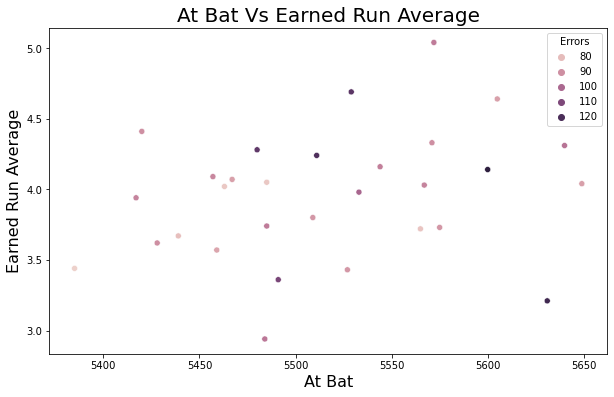

In [59]:
plt.figure(figsize=[10,6])
plt.title('At Bat Vs Earned Run Average',fontsize =20)
sns.scatterplot(df['At Bat'],df['Earned Run Average'],hue=df['Errors'], cmap=('Spectral'))
plt.xlabel('At Bat',fontsize =16)
plt.ylabel('Earned Run Average',fontsize =16)

We can not get significant observation as it is distributed

Text(0, 0.5, 'At Bat')

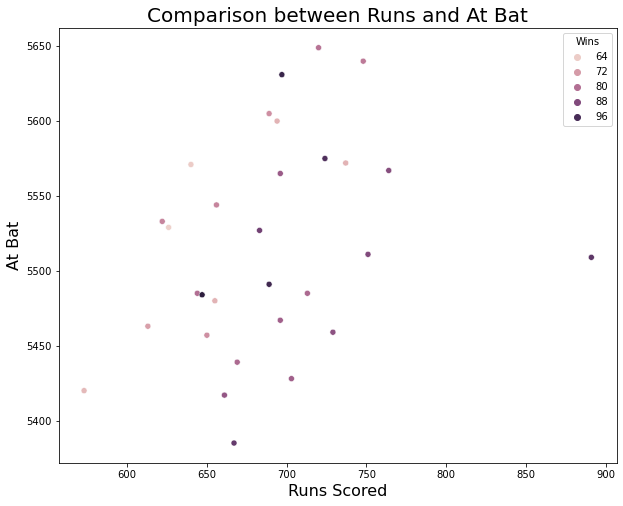

In [60]:
plt.figure(figsize=[10,8])
plt.title('Comparison between Runs and At Bat', fontsize =20)
sns.scatterplot(df['Runs Scored'],df['At Bat'],hue=df['Wins'])
plt.xlabel('Runs Scored',fontsize =16)
plt.ylabel("At Bat",fontsize =16)

Text(0, 0.5, 'Strike Outs')

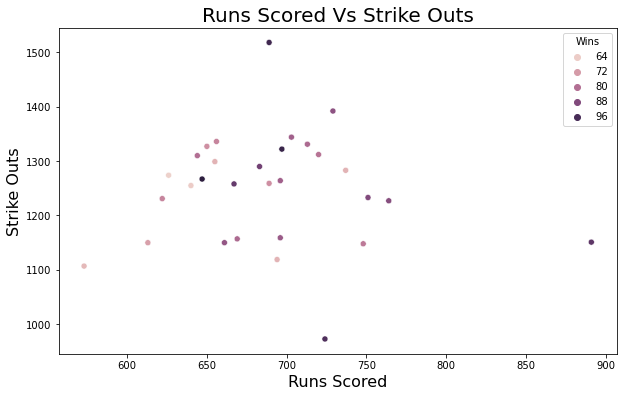

In [61]:
plt.figure(figsize=[10,6])
plt.title('Runs Scored Vs Strike Outs',fontsize =20)
sns.scatterplot(df['Runs Scored'],df['Strike Outs'],hue=df['Wins'])
plt.xlabel('Runs Scored',fontsize =16)
plt.ylabel('Strike Outs',fontsize =16)

Comment :
In simple word strike Outs means batter is out. We can see Strike out opponent team below 700 runs essential for more win.

Clearly Strikeout below 1200 is like making recipe for losing game. Strikeouts in regular interval not only lead to pressure on opponent in game but also bring break on high run score.

Text(0, 0.5, 'Earned Run Average')

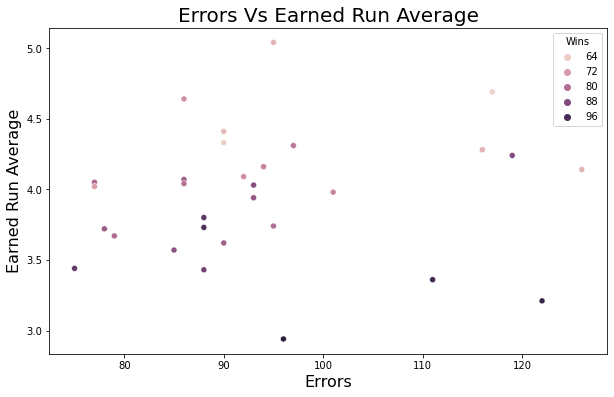

In [62]:
plt.figure(figsize=[10,6])
plt.title('Errors Vs Earned Run Average',fontsize =20)
sns.scatterplot(df['Errors'],df['Earned Run Average'],hue=df['Wins'], cmap=('Spectral'))
plt.xlabel('Errors',fontsize =16)
plt.ylabel('Earned Run Average',fontsize =16)

Keeping ERA below 3.5 or as much as low by Pitcher means sure win. By keeping low ERA pitcher saves run for his team.

Another things we can see in above scatter plot is that Minimum error means maximum wins. Keeping Errors below number 90 can be held as benchmark

Text(0, 0.5, 'Strike Out')

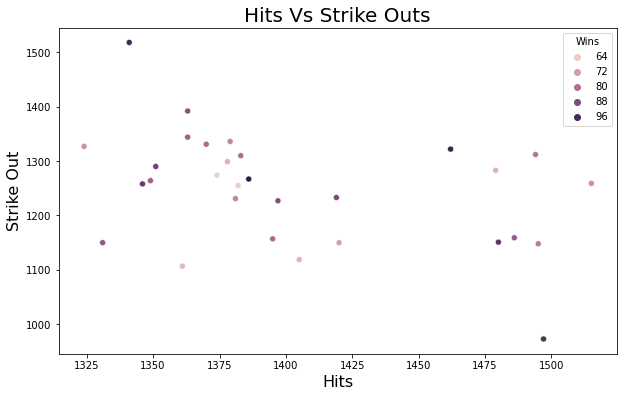

In [65]:
plt.figure(figsize=[10,6])
plt.title('Hits Vs Strike Outs',fontsize =20)
sns.scatterplot(df['Hits'],df['Strike Outs'],hue=df['Wins'], cmap=('Spectral'))
plt.xlabel('Hits',fontsize =16)
plt.ylabel('Strike Out',fontsize =16)

we can see there is no win in the range of strikeout below 1100 and hits below 1475

# Boxplot of the Features

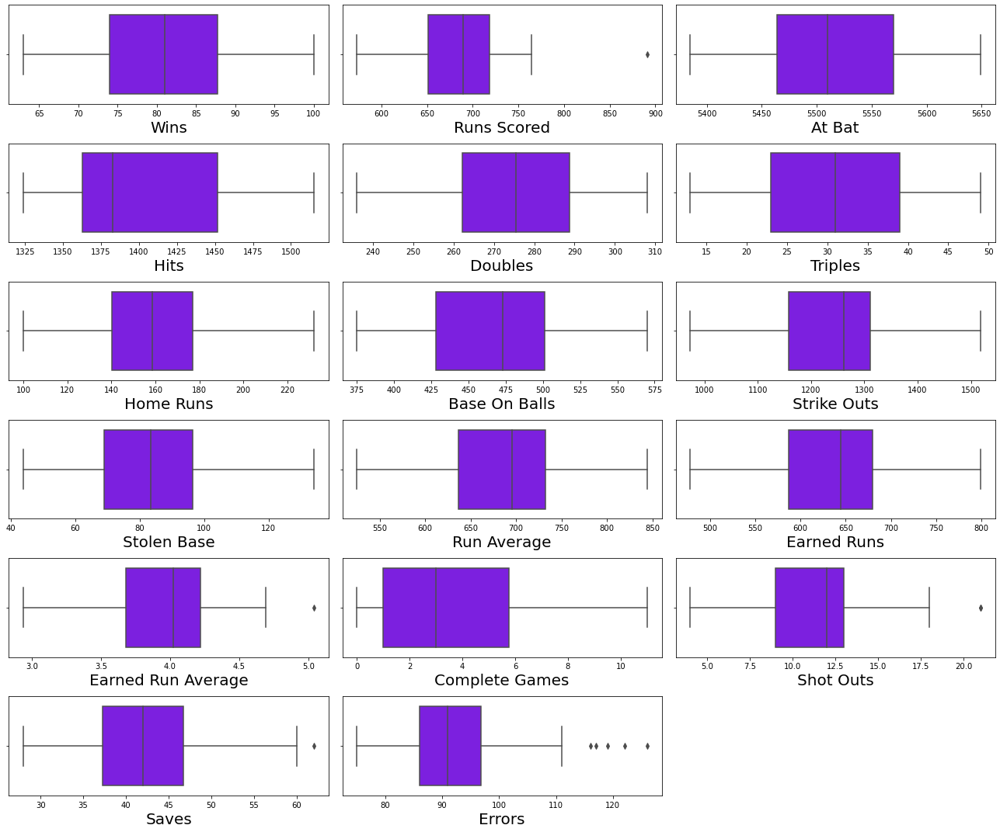

In [69]:
plt.figure(figsize=(18,15), facecolor='white')
plotnumber= 1
for column in df:
    if plotnumber <=18:
        ax=plt.subplot(6,3,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber = plotnumber+1
plt.tight_layout()
plt.show()

There are some outliers present in data. But as data is of Real world , these outliers are valid datapoints.

Shutouts are rare but completely possible with exceptional performance.

Run scored has one outliers but as Run is one of the most important parameter, it will be wise to remove corresponding datpoint.

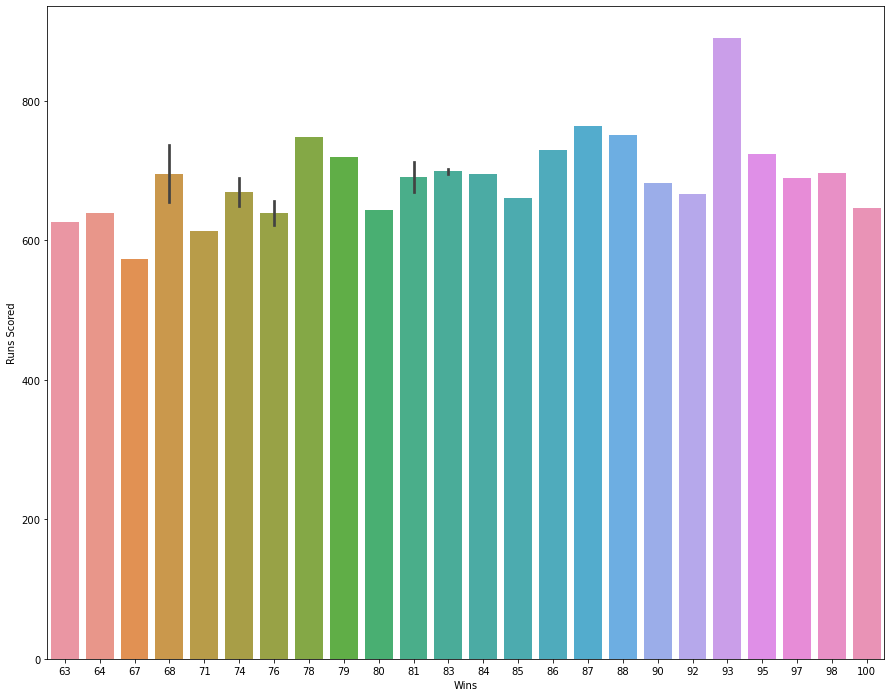

In [71]:
plt.figure(figsize=(15,12))
sns.barplot(x='Wins',y='Runs Scored',data=df)
plt.show()

comment:
If one team has to win or on the safer side, they have to score of atleast 600

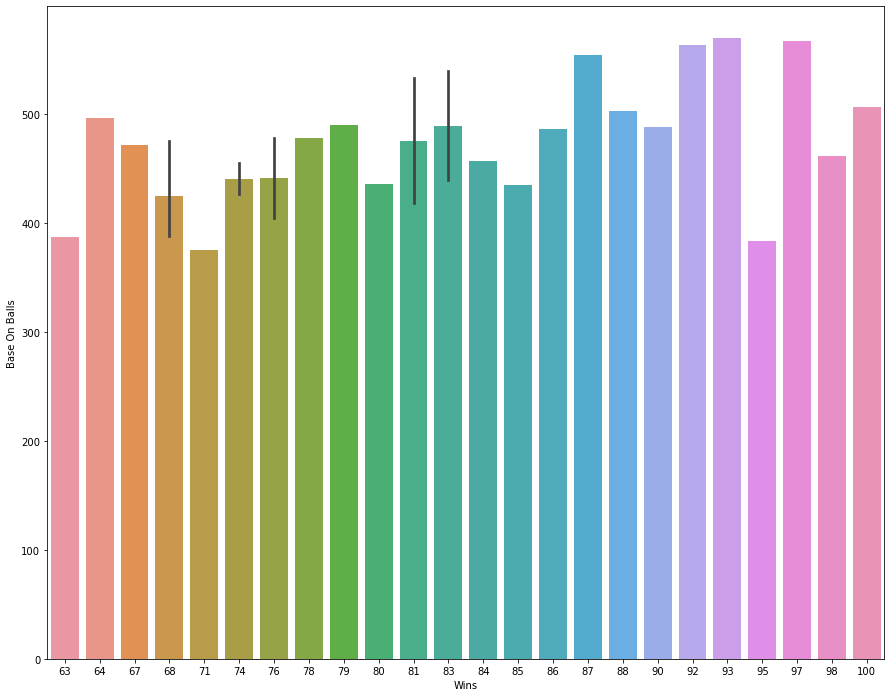

In [73]:
plt.figure(figsize=(15,12))
sns.barplot(x='Wins',y='Base On Balls',data=df)
plt.show()

 Comment :
Base on ball is contribution from pitcher to batter for winning.its like penalty from pitcher.

We can see that base on ball above 400 really contribute in Wins in team.

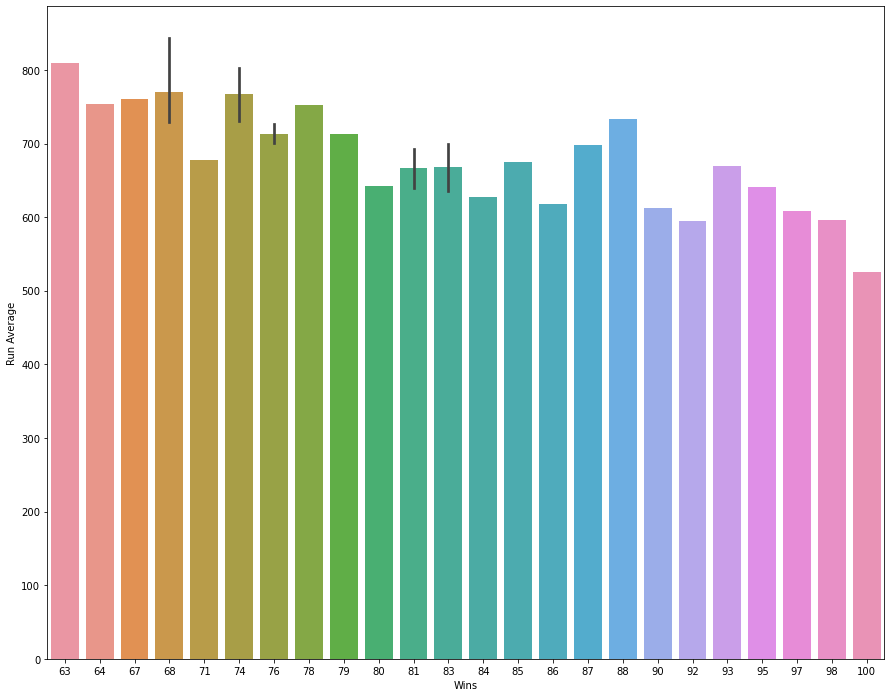

In [75]:
plt.figure(figsize=(15,12))
sns.barplot(x='Wins',y='Run Average',data=df)
plt.show()

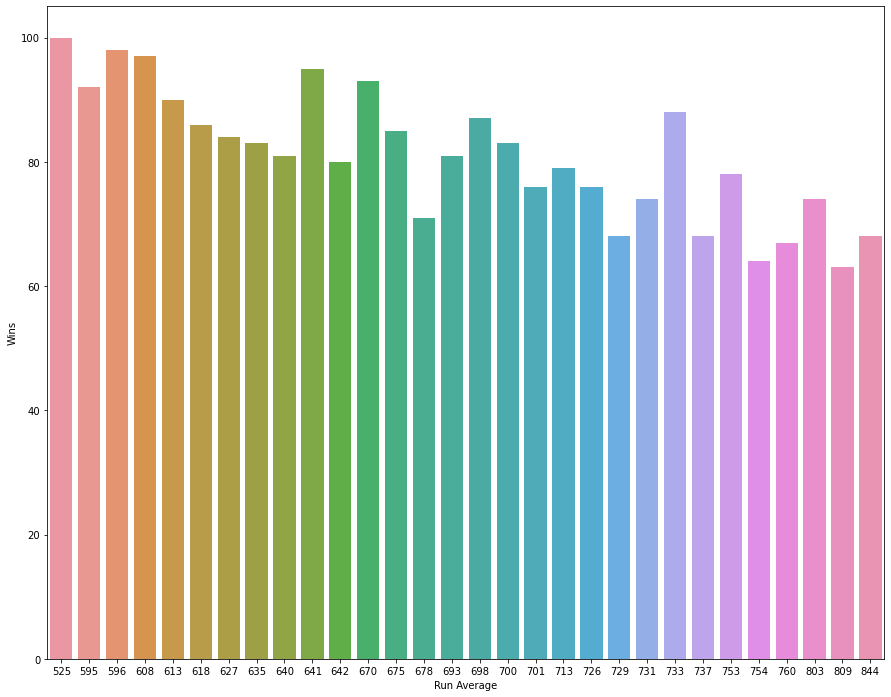

In [77]:
plt.figure(figsize=(15,12))
sns.barplot(x='Run Average',y='Wins',data=df)
plt.show()

Comment

for better visualization i have converted the x and y axis. as you can see the run average is increasing the win is decreasing but as we know more average means more win.

For this we can say that pitcher are playing more role than the hitter, even with more average run tean is win is decreasing.

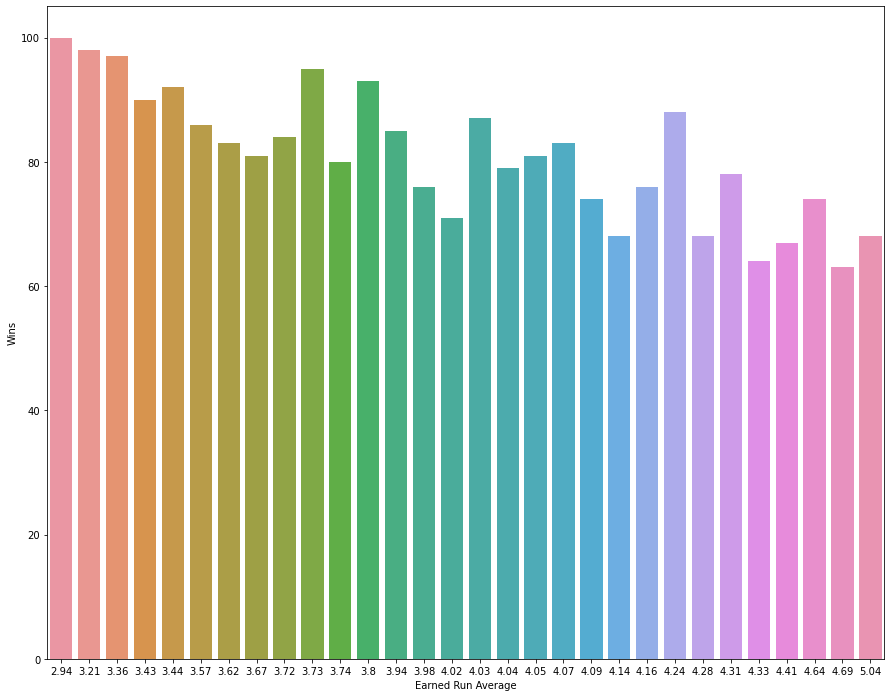

In [79]:
plt.figure(figsize=(15,12))
sns.barplot(x='Earned Run Average',y='Wins',data=df)
plt.show()

Now as we can see the low earned run average ruslts into more wins

through this plot we can say picther are dominating over batter for win.



both plots are looking related lets check through another plot their relation

Text(0, 0.5, 'Earned Run Average')

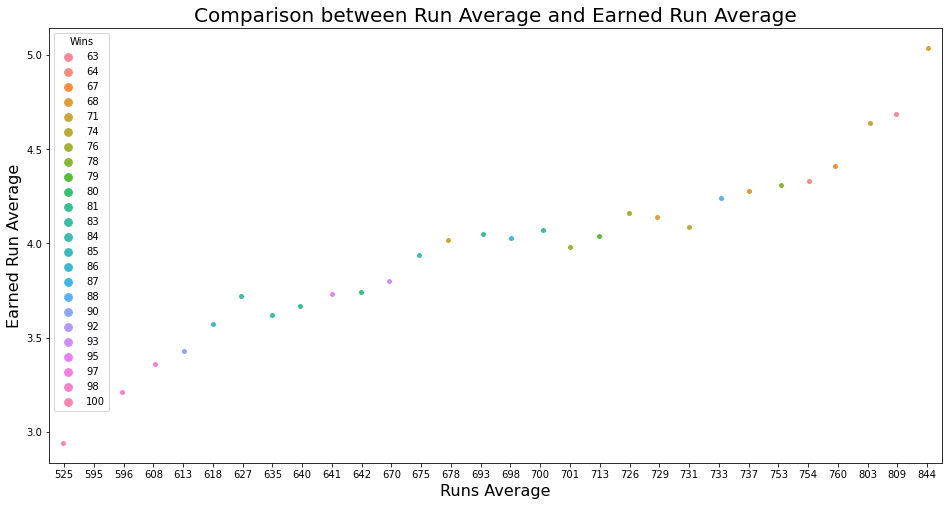

In [81]:
plt.figure(figsize=[16,8])
plt.title('Comparison between Run Average and Earned Run Average', fontsize =20)
sns.stripplot(df['Run Average'],df['Earned Run Average'],hue=df['Wins'])
plt.xlabel('Runs Average',fontsize =16)
plt.ylabel("Earned Run Average",fontsize =16)

We can see it is showing linear Relationship with point starting from 596 and end at 809, if we neglect the least and the extreme point.

We will check with jointplots

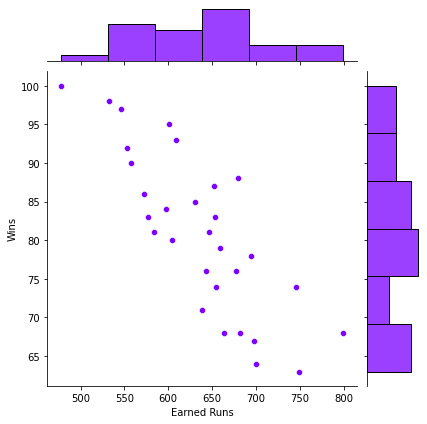

In [82]:
sns.jointplot(x="Earned Runs", y="Wins", data=df)

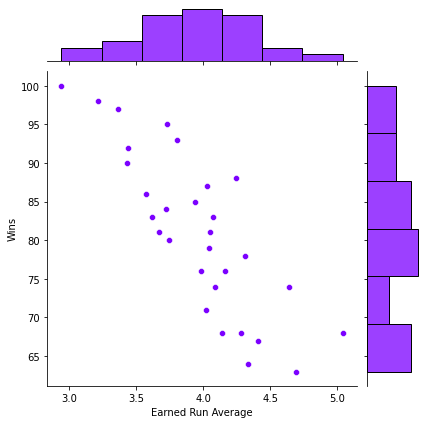

In [84]:
sns.jointplot(x="Earned Run Average", y="Wins", data=df)

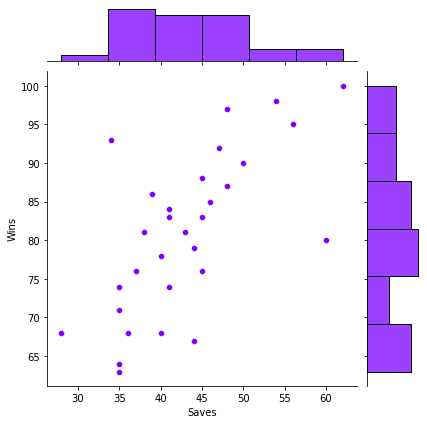

In [85]:
sns.jointplot(x="Saves", y="Wins", data=df)

More number of saves can result into more numbers of win

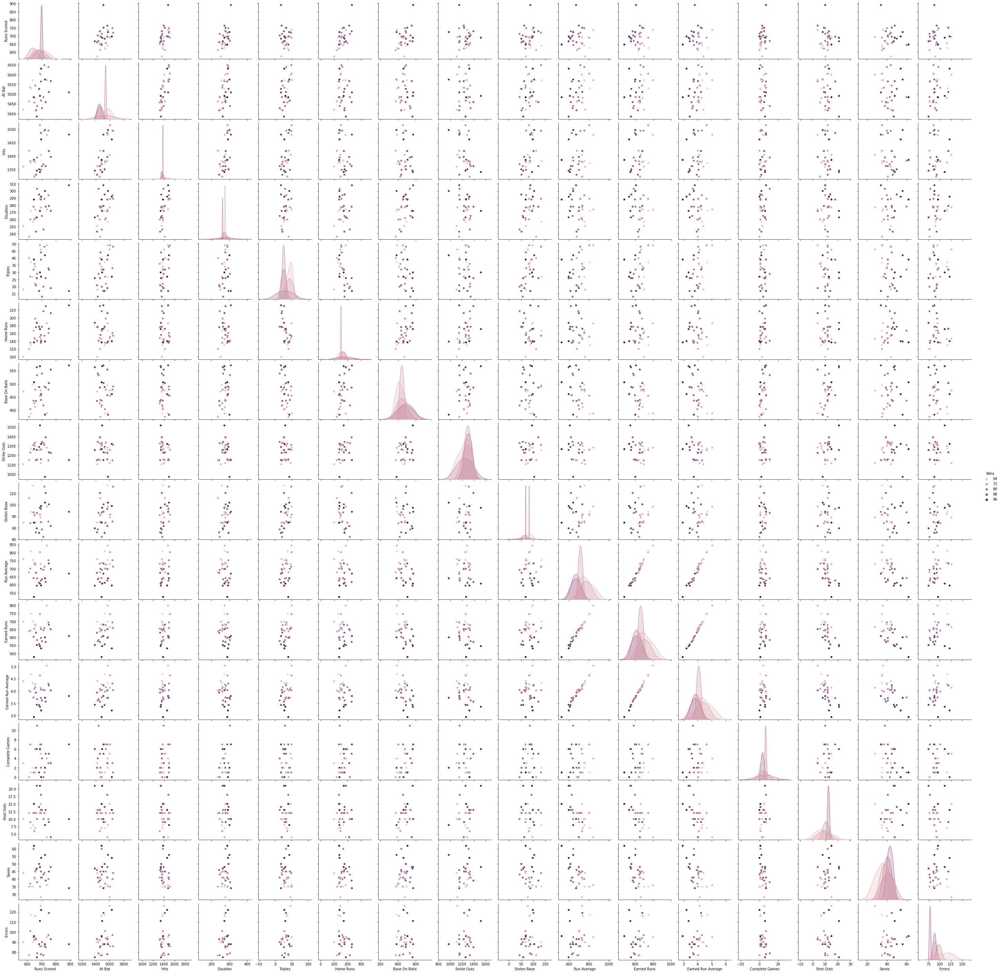

In [89]:
sns.pairplot(data=df,hue='Wins')

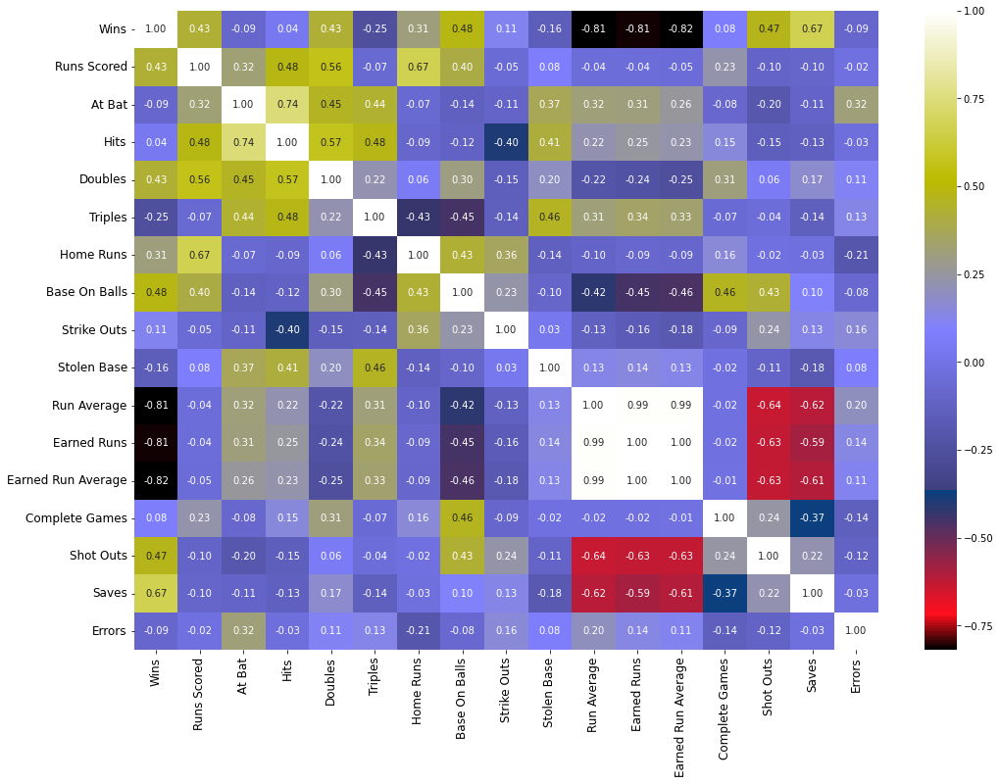

In [91]:
plt.figure(figsize=(17,12))
sns.heatmap(df.corr(),annot=True,fmt='0.2f',cmap="gist_stern")
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

As we can see Run Average, Earned Runs,Earned Run Average is highly correlated.

# Outlier Detection and Removal

In [95]:
from scipy.stats import zscore
z=np.abs(zscore(df))
threshold=3
df1=df[(z<3).all(axis=1)]
df1.shape

(29, 17)

In [97]:
print('Percentage Data loss:',(30-29)/30*100,'%')

Percentage Data loss: 3.3333333333333335 %


3.34 % data loss is acceptable

# Feature Selection and Engineering

In [99]:
df1.skew()

Wins                  0.119013
Runs Scored          -0.215364
At Bat                0.169573
Hits                  0.783772
Doubles              -0.335304
Triples               0.090124
Home Runs             0.450862
Base On Balls         0.151193
Strike Outs          -0.233815
Stolen Base           0.494966
Run Average           0.018155
Earned Runs           0.018461
Earned Run Average    0.016693
Complete Games        0.854980
Shot Outs             0.526943
Saves                 0.627480
Errors                0.840271
dtype: float64

Acceptable range of skewness is -5 to 5

As we can see Hits,Complete Games,Shot Outs,Saves,Errors is slightly positive skew

## Transforming right skew data using Boxcox Transformation

In [100]:
from scipy.stats import boxcox

In [101]:
df1['Hits']=boxcox(df1['Hits'],-2)

In [103]:
df1['Shot Outs']=boxcox(df1['Shot Outs'],0.5)

In [104]:
df1['Saves']=boxcox(df1['Saves'],0.5)

In [105]:
from sklearn.preprocessing import PowerTransformer
from sklearn.compose import ColumnTransformer

In [107]:
EC=['Errors','Complete Games']
ds =df1[EC].copy()

In [108]:
column_trans =ColumnTransformer(
    [  ('Errors',PowerTransformer(method='yeo-johnson',standardize=True),['Errors']),
      ('Complete Games',PowerTransformer(method='yeo-johnson',standardize=True),['Complete Games'])])
transformed_yeojohnson =column_trans.fit_transform(df1)   
new_cols=['Errors','Complete Games']
dataset=pd.DataFrame(transformed_yeojohnson,columns=new_cols) #to convert numpy array back into dataframe
pd.concat([dataset],axis=1)
dataset.head()

,Errors,Complete Games
0,-0.348265,-0.307098
1,-0.540820,-0.307098
2,-1.326125,2.011315
3,0.650818,1.264463
4,-0.540820,1.264463


In [109]:
# reseting index and mergeing transform data
df1.reset_index(drop=True, inplace=True)
dataset.index=df1.index
df1[EC]=dataset[EC]

In [110]:
df1.skew()

Wins                  0.119013
Runs Scored          -0.215364
At Bat                0.169573
Hits                  0.000000
Doubles              -0.335304
Triples               0.090124
Home Runs             0.450862
Base On Balls         0.151193
Strike Outs          -0.233815
Stolen Base           0.494966
Run Average           0.018155
Earned Runs           0.018461
Earned Run Average    0.016693
Complete Games       -0.045947
Shot Outs            -0.085802
Saves                 0.370280
Errors                0.065585
dtype: float64

Now skewness is removed, all the values is in the limit of -5 to 5

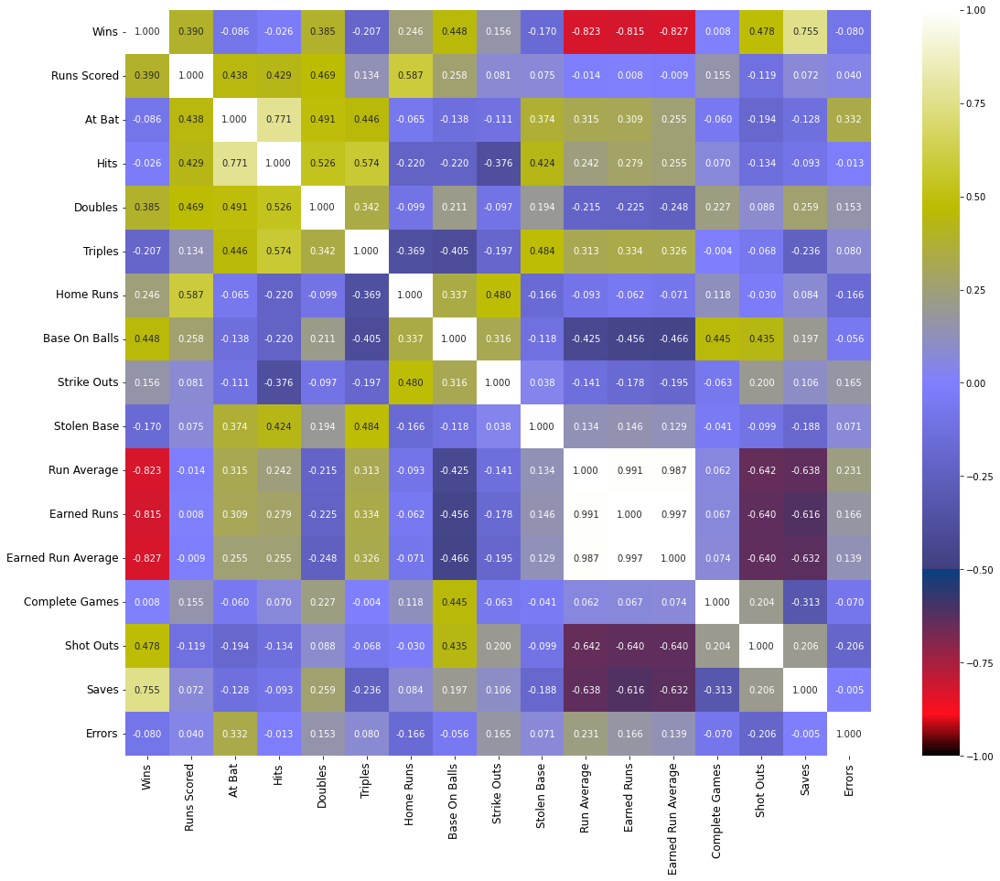

In [111]:
plt.figure(figsize=(20,15))
sns.heatmap(df1.corr(), vmin=-1, vmax=1, annot=True, square=True, fmt='0.3f', 
            annot_kws={'size':10}, cmap="gist_stern")
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

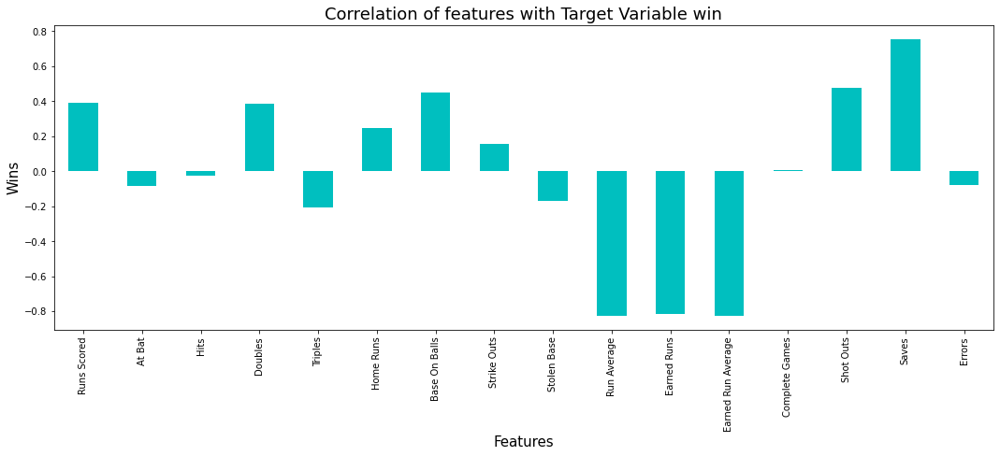

In [112]:
plt.figure(figsize = (18,6))
df1.corr()['Wins'].drop(['Wins']).plot(kind='bar',color = 'c')
plt.xlabel('Features',fontsize=15)
plt.ylabel('Wins',fontsize=15)
plt.title('Correlation of features with Target Variable win',fontsize = 18)
plt.show()

Comment :

Hits, At bats, Complete game and errors are very poorly correlated with target variable.

Saves, ERA,RA,EA are highly correleated with target variable.

here is visible multi colinearity between the feature columns "Earned Runs", "Earned Run Average" and "Runs Average". This need to check.


# Checking Multicollinearity using Variance Inflation Factor

In [119]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif= pd.DataFrame()
vif['VIF']= [variance_inflation_factor(df1.values,i) for i in range(df1.shape[1])]
vif['Features']= df1.columns
vif

,VIF,Features
0,1241.003534,Wins
1,3248.685492,Runs Scored
2,67999.633336,At Bat
3,61783.303243,Hits
4,1059.348657,Doubles
5,33.888446,Triples
6,249.058062,Home Runs
7,282.902409,Base On Balls
8,414.389674,Strike Outs
9,25.992021,Stolen Base


# Standard Scaling

In [121]:
X=df1.drop(columns=['Wins'])
Y=df1['Wins']

In [122]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_scaler=scaler.fit_transform(X)

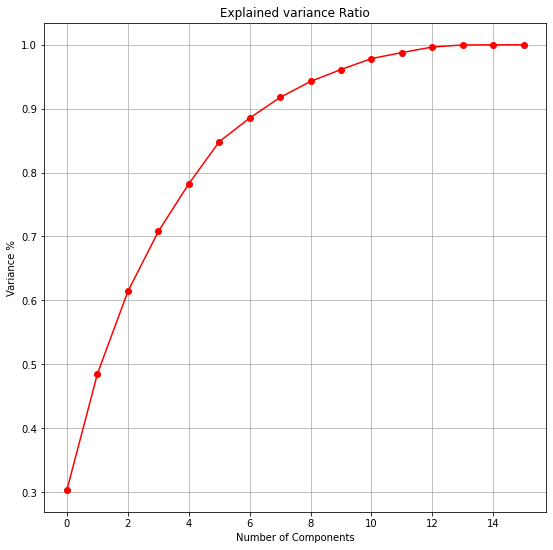

In [126]:
from sklearn.decomposition import PCA
pca=PCA()
#plotting the graph to find the principle components
x_pca = pca.fit_transform(X_scaler)
plt.figure(figsize=(9,9))
plt.plot(np.cumsum(pca.explained_variance_ratio_),'ro-')
plt.xlabel('Number of Components')
plt.ylabel('Variance %')
plt.title('Explained variance Ratio')
plt.grid()

### Comment -

As per the graph, we can see that 9 principal components attribute for 95% of variation in the data. We shall pick the first 9 components for our prediction

In [129]:
pca_new=PCA(n_components=9)
x_new=pca_new.fit_transform(X_scaler)
principle_x=pd.DataFrame(x_new,columns=np.arange(9))

In [130]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif= pd.DataFrame()
vif['VIF']= [variance_inflation_factor(principle_x.values,i) for i in range(principle_x.shape[1])]
vif['Features']= principle_x.columns
vif

,VIF,Features
0,1.0,0
1,1.0,1
2,1.0,2
3,1.0,3
4,1.0,4
5,1.0,5
6,1.0,6
7,1.0,7
8,1.0,8


multicollinearity is redued.

# Machine Learning Model Building

In [149]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split,cross_val_score
from xgboost import XGBRegressor

In [137]:
X_train,X_test,Y_train,Y_test=train_test_split(principle_x,Y,random_state=40,test_size=0.3)
print('Training feature matrix size:',X_train.shape)
print('Training target vector size:',Y_train.shape)
print('Test feature matrix size:',X_test.shape)
print('Test target vector size:',Y_test.shape)

Training feature matrix size: (20, 9)
Training target vector size: (20,)
Test feature matrix size: (9, 9)
Test target vector size: (9,)


## Finding best Random State

In [138]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
maxR2_score=0
maxRS=0
for i in range(1,250):
    X_train,X_test,Y_train,Y_test=train_test_split(principle_x,Y,random_state=i,test_size=.25)
    lin_reg=LinearRegression()
    lin_reg.fit(X_train,Y_train)
    y_pred=lin_reg.predict(X_test)
    R2=r2_score(Y_test,y_pred)
    if R2>maxR2_score:
        maxR2_score=R2
        maxRS=i
print('Best R2 Score is', maxR2_score,'on Random_state',maxRS)
                        

Best R2 Score is 0.9379323024071246 on Random_state 209


### Linear Regression:Base Model 

In [143]:
X_train,X_test,Y_train,Y_test=train_test_split(principle_x,Y,random_state=209,test_size=.25)
lin_reg=LinearRegression()
lin_reg.fit(X_train,Y_train)
lin_reg.score(X_train,Y_train)
y_pred=lin_reg.predict(X_test)
print('Predicted Wins',y_pred)
print('\n')
print('Actual Wins',Y_test)

Predicted Wins [93.78694582 67.58959705 77.82223286 91.39059857 98.97268782 92.67705278
 87.5484039  66.81507982]


Actual Wins 19     90
18     64
12     76
24     92
14    100
15     98
20     83
22     67
Name: Wins, dtype: int64


### Linear Regression Evaluation Matrix

In [147]:
print('Error:')
print('Mean Absolute error:',mean_absolute_error(Y_test,y_pred))
print('Mean Squared error:',mean_squared_error(Y_test,y_pred))
print('Root Mean Squared error:',np.sqrt(mean_squared_error(Y_test,y_pred)),'\n')
print('R2 Score')
print(r2_score(Y_test,y_pred,multioutput='variance_weighted'))

Error:
Mean Absolute error: 2.611470077965757
Mean Squared error: 10.128672400937354
Root Mean Squared error: 3.1825575251576135 

R2 Score
0.9379323024071244


### Cross Validation

In [151]:
score = cross_val_score(lin_reg, principle_x, Y, cv =2)
print('Cross Validation Score :',lin_reg)
print("Mean CV Score :",score.mean())

Cross Validation Score : LinearRegression()
Mean CV Score : 0.48242603991597954


True Values Vs Predicted Value


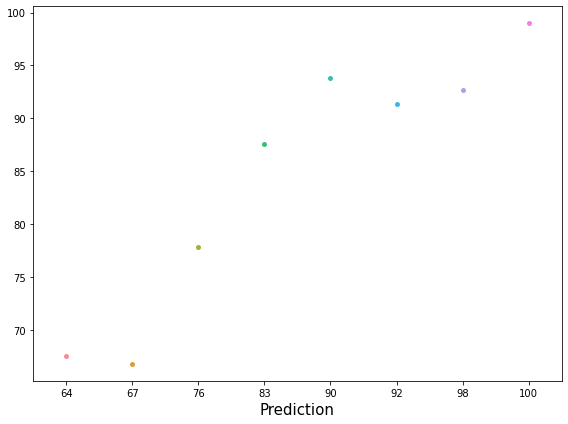

In [156]:
plt.figure(figsize=(8,6))
y_pred=lin_reg.predict(X_test)
sns.swarmplot(Y_test.round(3),y_pred)
print('True Values Vs Predicted Value')
plt.xlabel('True Value',fontsize=15)
plt.xlabel('Prediction',fontsize=15)
plt.tight_layout()

### Finding best n_neighbors for KNN Regressor

In [160]:
from sklearn import neighbors
from math import sqrt
rmse_val=[]
for K in range(10):
    K=K+1
    model=neighbors.KNeighborsRegressor(n_neighbors=K)
    model.fit(X_train,Y_train)
    y_pred=model.predict(X_test)
    error = sqrt(mean_squared_error(Y_test,y_pred)) #calculate rmse
    rmse_val.append(error) #store rmse values
    print('RMSE value for k= ' , K , 'is:', error)

RMSE value for k=  1 is: 11.434596626029272
RMSE value for k=  2 is: 10.324424923452153
RMSE value for k=  3 is: 9.414822828332397
RMSE value for k=  4 is: 9.05365948111591
RMSE value for k=  5 is: 8.254695633395576
RMSE value for k=  6 is: 8.47770769593867
RMSE value for k=  7 is: 8.62926912978647
RMSE value for k=  8 is: 9.152889741770082
RMSE value for k=  9 is: 9.588364218940669
RMSE value for k=  10 is: 10.203369541479915


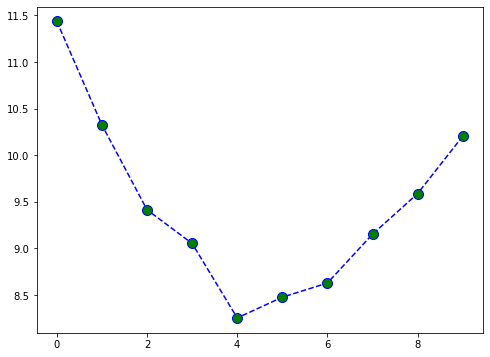

In [161]:
#plotting the rmse values against k values -
plt.figure(figsize = (8,6))
plt.plot(range(10), rmse_val, color='blue', linestyle='dashed', marker='o', markerfacecolor='green', markersize=10)

Comment-

At k= 5, we get the minimum RMSE value which approximately 8.254695633395576, and shoots up on further increasing the k value. We can safely say that k=5 will give us the best result in this case



## Applying other Regression Model, Evaluation & Crossvalidation

In [177]:
rf = RandomForestRegressor(n_estimators = 250 ,max_depth=6)
svr=SVR(C=1.0, epsilon=0.2, kernel='poly', gamma='auto')
dtc = DecisionTreeRegressor(criterion='mse')
adb=AdaBoostRegressor(learning_rate=0.1)
gradb=GradientBoostingRegressor( max_depth=6,learning_rate=0.1)
knn=KNeighborsRegressor(n_neighbors=4,algorithm='kd_tree')
ls= Lasso(alpha=1e-2, normalize=True, max_iter=1e5)
rd=Ridge(alpha=1e-2, normalize=True)
xgb=XGBRegressor()
model = [rf,ls,rd,svr,dtc,adb,gradb,knn,xgb]

for m in model:
    m.fit(X_train,Y_train)
    m.score(X_train,Y_train)
    y_pred = m.predict(X_test)
    print('\n')                                        
    print('Error of', m)
    print('Mean absolute error :', mean_absolute_error(Y_test,y_pred))
    print('Mean squared error :', mean_squared_error(Y_test,y_pred))
    print('Root Mean Squared Error:', np.sqrt(mean_squared_error(Y_test,y_pred)))
    print('\n')

    print('R2 Score')
    print(r2_score(Y_test,y_pred)) 
    
    # Cross Validation
    score = cross_val_score(m, principle_x, Y, cv =4)
    print('\n')
    print('\033[1m'+'Cross Validation Score :',m,":"+'\033[0m\n')
    print("Mean CV Score :",score.mean())
    print('==============================================================================================================')



Error of RandomForestRegressor(max_depth=6, n_estimators=250)
Mean absolute error : 8.548
Mean squared error : 92.73048494444444
Root Mean Squared Error: 9.629666917627237


R2 Score
0.4317549754457637


Cross Validation Score : RandomForestRegressor(max_depth=6, n_estimators=250) :

Mean CV Score : 0.2255036406296224


Error of Lasso(alpha=0.01, max_iter=100000.0, normalize=True)
Mean absolute error : 2.8700636647440145
Mean squared error : 11.475283088035821
Root Mean Squared Error: 3.387518721429569


R2 Score
0.9296803793915844


Cross Validation Score : Lasso(alpha=0.01, max_iter=100000.0, normalize=True) :

Mean CV Score : 0.6462896140897422


Error of Ridge(alpha=0.01, normalize=True)
Mean absolute error : 2.7218947468397854
Mean squared error : 10.759022876442998
Root Mean Squared Error: 3.2800949493029923


R2 Score
0.9340695649088135


Cross Validation Score : Ridge(alpha=0.01, normalize=True) :

Mean CV Score : 0.643139896551145


Error of SVR(epsilon=0.2, gamma='auto', ke

## We can see that the minimum difference between the R2 and cross validation score is observed in the lassoRegression with the difference of 0.283, and accuracy is 92.96% approx.



True Values Vs Predicted Value plot RandomForestRegressor(max_depth=6, n_estimators=250)


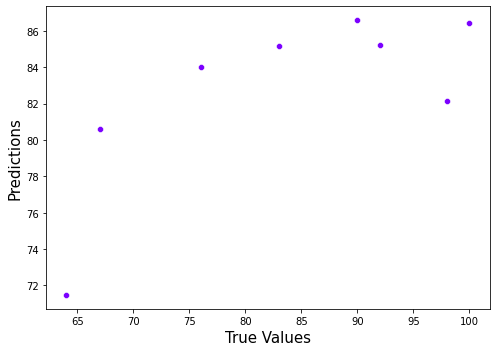





True Values Vs Predicted Value plot Lasso(alpha=0.01, max_iter=100000.0, normalize=True)


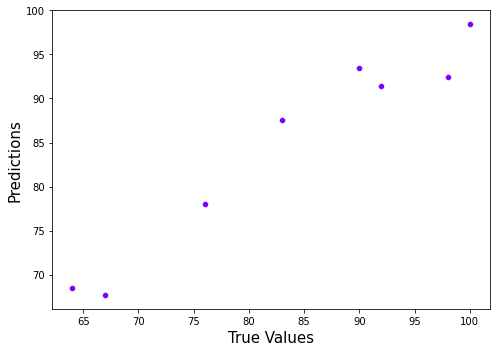





True Values Vs Predicted Value plot Ridge(alpha=0.01, normalize=True)


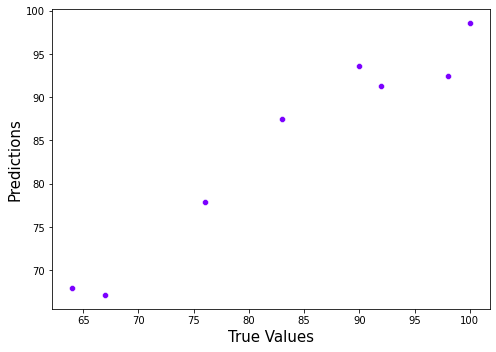





True Values Vs Predicted Value plot SVR(epsilon=0.2, gamma='auto', kernel='poly')


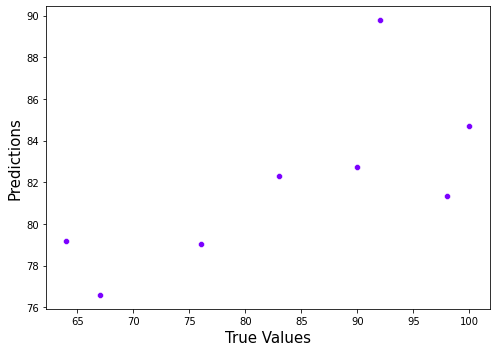





True Values Vs Predicted Value plot DecisionTreeRegressor()


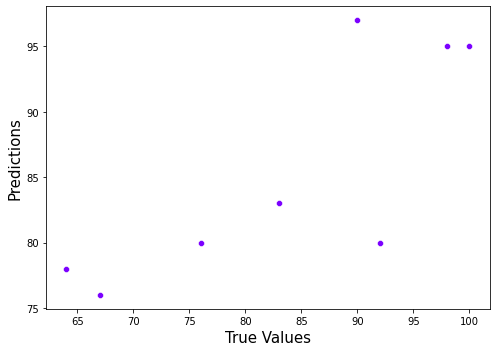





True Values Vs Predicted Value plot AdaBoostRegressor(learning_rate=0.1)


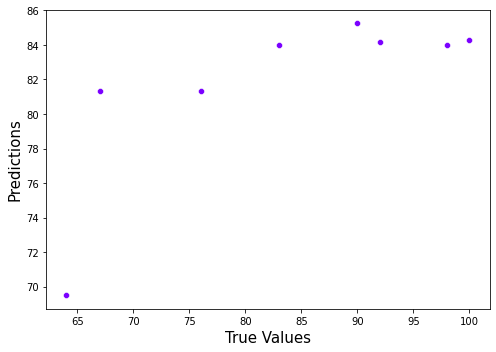





True Values Vs Predicted Value plot GradientBoostingRegressor(max_depth=6)


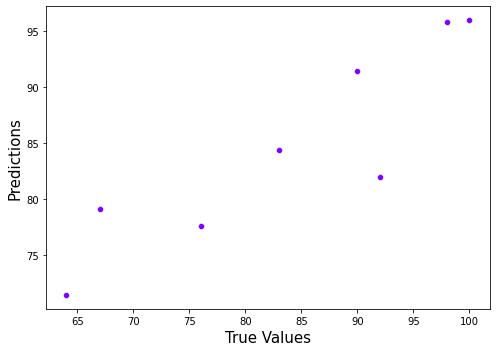





True Values Vs Predicted Value plot KNeighborsRegressor(algorithm='kd_tree', n_neighbors=4)


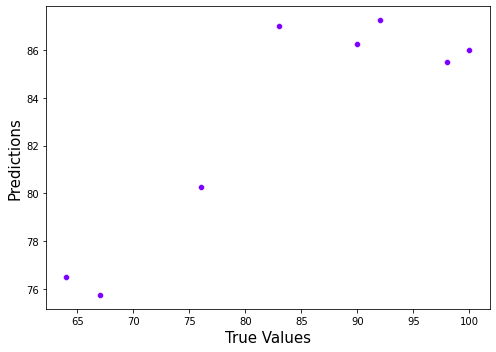





True Values Vs Predicted Value plot XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)


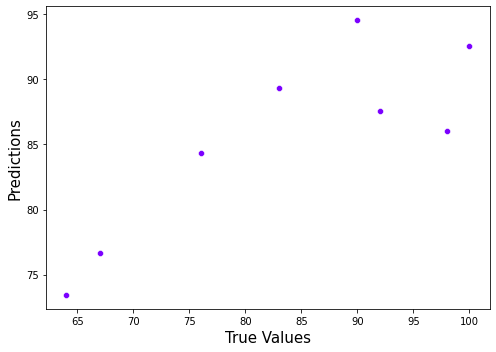

In [178]:
model = [rf,ls,rd,svr,dtc,adb,gradb,knn,xgb]

for m in model:
    plt.figure(figsize=(7,5))
    m.fit(X_train,Y_train)
    y_pred=m.predict(X_test)
    print('\n')
    print('True Values Vs Predicted Value plot', m)
    sns.scatterplot(Y_test.round(2), y_pred)
    plt.xlabel('True Values' , fontsize=15)
    plt.ylabel('Predictions', fontsize=15)
    plt.tight_layout()
    plt.show()
    print('\n')
    print('===================================================================================================')

# Hyper Parameter Tuning : GridSearchCV

In [179]:
from sklearn.model_selection import GridSearchCV

In [180]:
parameter = {'alpha':np.array([1,0.5,0.1,0.01,0.001,0.0001]),
             'fit_intercept': [True,False],'normalize':[True,False],
             'max_iter':[250,500,1000,1500],'random_state':np.arange(100),
             'selection':["cyclic","random"]}

In [181]:
GCV = GridSearchCV(Lasso(),parameter,cv=5,n_jobs = -1,verbose = 3)

In [182]:
GCV.fit(X_train,Y_train)

Fitting 5 folds for each of 19200 candidates, totalling 96000 fits
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=0, selection=random;, score=0.507 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=0, selection=random;, score=-0.243 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=1, selection=cyclic;, score=0.133 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=1, selection=random;, score=0.507 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=1, selection=random;, score=-3.001 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=2, selection=cyclic;, score=-3.001 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=2, 

[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=random;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=random;, score=-0.243 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=random;, score=-2.989 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=49, selection=cyclic;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=49, selection=cyclic;, score=0.133 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=49, selection=cyclic;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=49, selection=cyclic;, score=-0.243 total time=   0.0s
[CV 5/5] E

[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=94, selection=cyclic;, score=0.133 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=94, selection=cyclic;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=True, random_state=94, selection=cyclic;, score=-0.243 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=False, random_state=42, selection=cyclic;, score=-0.727 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=False, random_state=42, selection=random;, score=0.733 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=False, random_state=42, selection=random;, score=0.830 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=False, random_state=42, selection=random;, score=0.201 total time=   0.0s
[CV 4/5

[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=False, random_state=63, selection=random;, score=0.830 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=False, random_state=63, selection=random;, score=0.201 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=False, random_state=63, selection=random;, score=-0.162 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=False, random_state=63, selection=random;, score=-0.728 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=False, random_state=64, selection=cyclic;, score=0.733 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=False, random_state=64, selection=cyclic;, score=0.830 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=250, normalize=False, random_state=64, selection=cyclic;, score=0.201 total time=   0.0s
[CV 

[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=50, selection=random;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=50, selection=random;, score=-0.243 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=50, selection=random;, score=-3.003 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=51, selection=cyclic;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=51, selection=cyclic;, score=0.133 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=51, selection=cyclic;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=51, selection=cyclic;, score=-0.243 total time=   0.0s
[CV 5/5] E

[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=89, selection=random;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=89, selection=random;, score=0.133 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=89, selection=random;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=89, selection=random;, score=-0.243 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=89, selection=random;, score=-3.001 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=90, selection=cyclic;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=90, selection=cyclic;, score=0.133 total time=   0.0s
[CV 3/5] EN

[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=93, selection=random;, score=-3.006 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=94, selection=cyclic;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=94, selection=cyclic;, score=0.133 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=94, selection=cyclic;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=94, selection=cyclic;, score=-0.243 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=94, selection=cyclic;, score=-3.001 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=94, selection=random;, score=0.507 total time=   0.0s
[CV 2/5] E

[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=68, selection=random;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=68, selection=random;, score=-0.243 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=68, selection=random;, score=-3.000 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=69, selection=cyclic;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=69, selection=cyclic;, score=0.133 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=69, selection=cyclic;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=500, normalize=True, random_state=69, selection=cyclic;, score=-0.243 total time=   0.0s
[CV 5/5] E

[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=5, selection=random;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=5, selection=random;, score=0.133 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=5, selection=random;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=5, selection=random;, score=-0.243 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=5, selection=random;, score=-3.001 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=6, selection=cyclic;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=6, selection=cyclic;, score=0.133 total time=   0.0s
[CV 3/5] EN

[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=57, selection=cyclic;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=57, selection=cyclic;, score=0.133 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=57, selection=cyclic;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=57, selection=cyclic;, score=-0.243 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=57, selection=cyclic;, score=-3.001 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=57, selection=random;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=True, random_state=57, selection=random;, score=0.133 total time=   0.0s
[CV 

[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=19, selection=cyclic;, score=0.830 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=19, selection=cyclic;, score=0.201 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=19, selection=cyclic;, score=-0.162 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=19, selection=cyclic;, score=-0.727 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=19, selection=random;, score=0.733 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=19, selection=random;, score=0.830 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=19, selection=random;, score=0.201 total time=   0.

[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=34, selection=cyclic;, score=-0.727 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=34, selection=random;, score=0.733 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=34, selection=random;, score=0.830 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=34, selection=random;, score=0.201 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=34, selection=random;, score=-0.162 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=34, selection=random;, score=-0.729 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1000, normalize=False, random_state=35, selection=cyclic;, score=0.733 total time=   0

[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=7, selection=cyclic;, score=-0.243 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=7, selection=cyclic;, score=-3.001 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=7, selection=random;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=7, selection=random;, score=0.133 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=7, selection=random;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=7, selection=random;, score=-0.243 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=7, selection=random;, score=-2.971 total time=   0.0s
[CV 1/5] 

[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=46, selection=random;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=46, selection=random;, score=-0.243 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=46, selection=random;, score=-2.999 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=47, selection=cyclic;, score=0.507 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=47, selection=cyclic;, score=0.133 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=47, selection=cyclic;, score=0.114 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=True, random_state=47, selection=cyclic;, score=-0.243 total time=   0.0s
[CV

[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=66, selection=random;, score=-0.731 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=67, selection=cyclic;, score=0.733 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=67, selection=cyclic;, score=0.830 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=67, selection=cyclic;, score=0.201 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=67, selection=cyclic;, score=-0.162 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=67, selection=cyclic;, score=-0.727 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=67, selection=random;, score=0.733 total time=   0

[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=29, selection=random;, score=-0.727 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=30, selection=cyclic;, score=0.733 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=30, selection=cyclic;, score=0.830 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=30, selection=cyclic;, score=0.201 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=30, selection=cyclic;, score=-0.162 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=30, selection=cyclic;, score=-0.727 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=True, max_iter=1500, normalize=False, random_state=30, selection=random;, score=0.733 total time=   0

[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=50, selection=cyclic;, score=-100.033 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=50, selection=cyclic;, score=-897.676 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=50, selection=random;, score=-1541.405 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=50, selection=random;, score=-332.795 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=50, selection=random;, score=-116.673 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=50, selection=random;, score=-100.073 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=50, selection=random;, score=-897.629 tot

[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=7, selection=random;, score=-897.635 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=97, selection=random;, score=-332.800 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=97, selection=random;, score=-116.671 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=97, selection=random;, score=-100.042 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=97, selection=random;, score=-897.600 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=98, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=True, random_state=98, selection=cyclic;, score=-332.796 tota

[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=67, selection=random;, score=-897.470 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=68, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=68, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=68, selection=cyclic;, score=-116.666 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=68, selection=cyclic;, score=-100.033 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=68, selection=cyclic;, score=-897.676 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=68, selection=random;, score=-1541

[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=21, selection=cyclic;, score=-100.033 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=21, selection=cyclic;, score=-897.676 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=21, selection=random;, score=-1541.386 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=21, selection=random;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=21, selection=random;, score=-116.665 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=21, selection=random;, score=-100.034 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=250, normalize=False, random_state=21, selection=random;, score=-897.

[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=34, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=34, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=34, selection=cyclic;, score=-116.666 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=34, selection=cyclic;, score=-100.033 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=34, selection=cyclic;, score=-897.676 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=34, selection=random;, score=-1541.459 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=34, selection=random;, score=-332.760 to

[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=59, selection=random;, score=-116.666 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=59, selection=random;, score=-100.064 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=59, selection=random;, score=-897.577 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=60, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=60, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=60, selection=cyclic;, score=-116.666 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=60, selection=cyclic;, score=-100.033 tot

[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=50, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=50, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=50, selection=cyclic;, score=-116.666 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=50, selection=cyclic;, score=-100.033 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=50, selection=cyclic;, score=-897.676 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=50, selection=random;, score=-1541.405 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=True, random_state=50, selection=random;, score=-332.795 to

[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=False, random_state=15, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=False, random_state=15, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=4, selection=random;, score=-100.034 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=4, selection=random;, score=-897.601 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=5, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=5, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=5, selection=cyclic;, score=-116.666 

[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=False, random_state=65, selection=random;, score=-100.058 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=False, random_state=65, selection=random;, score=-897.736 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=False, random_state=66, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=False, random_state=66, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=False, random_state=66, selection=cyclic;, score=-116.666 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=500, normalize=False, random_state=66, selection=cyclic;, score=-100.033 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=68, selection=random;, score=-100.

[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=cyclic;, score=-100.033 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=cyclic;, score=-897.676 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=random;, score=-1541.427 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=random;, score=-332.791 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=random;, score=-116.668 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=random;, score=-100.047 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=random;, score=-897.

[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=88, selection=random;, score=-332.757 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=88, selection=random;, score=-116.670 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=88, selection=random;, score=-100.001 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=88, selection=random;, score=-897.594 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=89, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=89, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=True, random_state=89, selection=cyclic;, score=-116.

[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=False, random_state=37, selection=random;, score=-116.650 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=False, random_state=37, selection=random;, score=-100.024 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=False, random_state=37, selection=random;, score=-897.632 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=False, random_state=38, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=False, random_state=38, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=False, random_state=38, selection=cyclic;, score=-116.666 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=False, random_state=38, selection=cyclic;, scor

[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=False, random_state=99, selection=random;, score=-100.010 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=1000, normalize=False, random_state=99, selection=random;, score=-897.649 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=0, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=0, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=0, selection=cyclic;, score=-116.666 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=0, selection=cyclic;, score=-100.033 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=0, selection=cyclic;, score=-897.676

[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=73, selection=random;, score=-897.590 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=74, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=74, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=74, selection=cyclic;, score=-116.666 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=74, selection=cyclic;, score=-100.033 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=74, selection=cyclic;, score=-897.676 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=74, selection=random;, score=-1541

[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=69, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=69, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=69, selection=cyclic;, score=-116.666 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=69, selection=cyclic;, score=-100.033 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=69, selection=cyclic;, score=-897.676 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=69, selection=random;, score=-1541.348 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=True, random_state=69, selection=random;, score=-332

[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=False, random_state=65, selection=cyclic;, score=-1541.460 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=False, random_state=65, selection=cyclic;, score=-332.796 total time=   0.0s
[CV 3/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=False, random_state=65, selection=cyclic;, score=-116.666 total time=   0.0s
[CV 4/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=False, random_state=65, selection=cyclic;, score=-100.033 total time=   0.0s
[CV 5/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=False, random_state=65, selection=cyclic;, score=-897.676 total time=   0.0s
[CV 1/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=False, random_state=65, selection=random;, score=-1541.299 total time=   0.0s
[CV 2/5] END alpha=1.0, fit_intercept=False, max_iter=1500, normalize=False, random_state=65, selection=random;, sco

[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=31, selection=cyclic;, score=0.064 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=31, selection=cyclic;, score=-0.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=31, selection=cyclic;, score=-2.179 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=31, selection=random;, score=0.910 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=31, selection=random;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=31, selection=random;, score=0.064 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=31, selection=random;, score=-0.122 total time=   0.0s
[CV 5/5] E

[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=22, selection=random;, score=0.064 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=22, selection=random;, score=-0.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=22, selection=random;, score=-2.179 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=23, selection=cyclic;, score=0.910 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=23, selection=cyclic;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=23, selection=cyclic;, score=0.064 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=23, selection=cyclic;, score=-0.122 total time=   0.0s
[CV 5/5] E

[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=49, selection=random;, score=-0.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=49, selection=random;, score=-2.180 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=50, selection=cyclic;, score=0.910 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=50, selection=cyclic;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=50, selection=cyclic;, score=0.064 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=50, selection=cyclic;, score=-0.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=50, selection=cyclic;, score=-2.179 total time=   0.0s
[CV 1/5] 

[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=99, selection=random;, score=-0.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=True, random_state=99, selection=random;, score=-2.179 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=0, selection=cyclic;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=0, selection=cyclic;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=0, selection=cyclic;, score=0.110 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=0, selection=cyclic;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=0, selection=cyclic;, score=-0.808 total time=   0.0s
[CV 1/5] 

[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=53, selection=random;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=53, selection=random;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=53, selection=random;, score=0.109 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=53, selection=random;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=53, selection=random;, score=-0.809 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=54, selection=cyclic;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=54, selection=cyclic;, score=0.707 total time=   0.0s
[CV 

[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=88, selection=cyclic;, score=-0.808 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=88, selection=random;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=88, selection=random;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=88, selection=random;, score=0.110 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=88, selection=random;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=88, selection=random;, score=-0.807 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=250, normalize=False, random_state=89, selection=cyclic;, score=0.598 total time=   0.0s
[CV

[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=True, random_state=64, selection=random;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=True, random_state=64, selection=random;, score=0.064 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=True, random_state=64, selection=random;, score=-0.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=True, random_state=64, selection=random;, score=-2.180 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=True, random_state=65, selection=cyclic;, score=0.910 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=True, random_state=65, selection=cyclic;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=True, random_state=65, selection=cyclic;, score=0.064 total time=   0.0s
[CV 4/5] EN

[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=78, selection=cyclic;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=78, selection=cyclic;, score=0.110 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=78, selection=cyclic;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=78, selection=cyclic;, score=-0.808 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=78, selection=random;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=78, selection=random;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=78, selection=random;, score=0.110 total time=   0.0s
[CV 

[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=40, selection=random;, score=-0.808 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=41, selection=cyclic;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=41, selection=cyclic;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=41, selection=cyclic;, score=0.110 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=41, selection=cyclic;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=41, selection=cyclic;, score=-0.808 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=41, selection=random;, score=0.598 total time=   0.0s
[CV

[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=91, selection=random;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=91, selection=random;, score=-0.808 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=92, selection=cyclic;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=92, selection=cyclic;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=92, selection=cyclic;, score=0.110 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=92, selection=cyclic;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=500, normalize=False, random_state=92, selection=cyclic;, score=-0.808 total time=   0.0s
[C

[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=3, selection=cyclic;, score=0.910 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=3, selection=cyclic;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=3, selection=cyclic;, score=0.064 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=3, selection=cyclic;, score=-0.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=3, selection=cyclic;, score=-2.179 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=3, selection=random;, score=0.910 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=3, selection=random;, score=0.553 total time=   0.0s
[CV 3/5] EN

[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=70, selection=cyclic;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=70, selection=cyclic;, score=0.064 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=70, selection=cyclic;, score=-0.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=70, selection=cyclic;, score=-2.179 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=70, selection=random;, score=0.910 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=70, selection=random;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=True, random_state=70, selection=random;, score=0.064 total time=   0.0s
[CV 

[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=41, selection=random;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=41, selection=random;, score=0.064 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=41, selection=random;, score=-0.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=41, selection=random;, score=-2.179 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=42, selection=cyclic;, score=0.910 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=42, selection=cyclic;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=42, selection=cyclic;, score=0.064 total time=   0.0s
[CV 

[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=False, random_state=76, selection=cyclic;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=False, random_state=76, selection=cyclic;, score=0.110 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=False, random_state=76, selection=cyclic;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=False, random_state=76, selection=cyclic;, score=-0.808 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=False, random_state=76, selection=random;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=False, random_state=76, selection=random;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1000, normalize=False, random_state=76, selection=random;, score=0.110 total time=   0.

[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=45, selection=cyclic;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=45, selection=cyclic;, score=0.064 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=45, selection=cyclic;, score=-0.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=45, selection=cyclic;, score=-2.179 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=45, selection=random;, score=0.910 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=45, selection=random;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=45, selection=random;, score=0.064 total time=   0.0s
[CV 

[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=cyclic;, score=-2.179 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=random;, score=0.910 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=random;, score=0.553 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=random;, score=0.064 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=random;, score=-0.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=random;, score=-2.179 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=True, random_state=82, selection=cyclic;, score=0.910 total time=   0.0s
[CV

[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=32, selection=random;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=32, selection=random;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=32, selection=random;, score=0.110 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=32, selection=random;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=32, selection=random;, score=-0.809 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=33, selection=cyclic;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=33, selection=cyclic;, score=0.707 total time=   0.

[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=43, selection=cyclic;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=43, selection=cyclic;, score=-0.808 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=43, selection=random;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=43, selection=random;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=43, selection=random;, score=0.110 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=43, selection=random;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=43, selection=random;, score=-0.808 total time=   

[CV 4/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=56, selection=cyclic;, score=-0.264 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=56, selection=cyclic;, score=-0.808 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=56, selection=random;, score=0.598 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=56, selection=random;, score=0.707 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=True, max_iter=1500, normalize=False, random_state=56, selection=random;, score=0.110 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=46, selection=cyclic;, score=-940.408 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=46, selection=random;, score=-1621.487 total time=

[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=87, selection=cyclic;, score=-940.408 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=87, selection=random;, score=-1621.519 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=87, selection=random;, score=-351.750 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=87, selection=random;, score=-122.785 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=87, selection=random;, score=-94.115 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=87, selection=random;, score=-940.361 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=88, selection=cyclic;, score=-1621.557 tot

[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=57, selection=random;, score=-122.793 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=57, selection=random;, score=-94.116 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=57, selection=random;, score=-940.320 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=58, selection=cyclic;, score=-1621.557 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=58, selection=cyclic;, score=-351.760 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=58, selection=cyclic;, score=-122.781 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=True, random_state=58, selection=cyclic;, score=-94.110 total

[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=7, selection=cyclic;, score=-351.760 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=7, selection=cyclic;, score=-122.781 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=False, random_state=31, selection=cyclic;, score=-940.408 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=False, random_state=31, selection=random;, score=-1621.343 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=False, random_state=31, selection=random;, score=-351.730 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=False, random_state=31, selection=random;, score=-122.791 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=250, normalize=False, random_state=31, selection=random;, score=-94.116 t

[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=76, selection=random;, score=-940.387 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=77, selection=cyclic;, score=-1621.557 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=77, selection=cyclic;, score=-351.760 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=77, selection=cyclic;, score=-122.781 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=77, selection=cyclic;, score=-94.110 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=77, selection=cyclic;, score=-940.408 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=77, selection=random;, score=-1621.356 tot

[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=44, selection=random;, score=-351.748 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=44, selection=random;, score=-122.773 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=44, selection=random;, score=-94.111 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=44, selection=random;, score=-940.351 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=45, selection=cyclic;, score=-1621.557 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=45, selection=cyclic;, score=-351.760 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=45, selection=cyclic;, score=-122.781 tota

[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=62, selection=random;, score=-94.119 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=62, selection=random;, score=-940.353 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=63, selection=cyclic;, score=-1621.557 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=63, selection=cyclic;, score=-351.760 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=63, selection=cyclic;, score=-122.781 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=63, selection=cyclic;, score=-94.110 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=63, selection=cyclic;, score=-940.408 total

[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=84, selection=random;, score=-1621.402 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=84, selection=random;, score=-351.739 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=84, selection=random;, score=-122.785 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=84, selection=random;, score=-94.095 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=84, selection=random;, score=-940.367 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=85, selection=cyclic;, score=-1621.557 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=True, random_state=85, selection=cyclic;, score=-351.760 tot

[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=84, selection=random;, score=-122.785 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=84, selection=random;, score=-94.095 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=84, selection=random;, score=-940.367 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=False, random_state=73, selection=cyclic;, score=-1621.557 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=False, random_state=73, selection=cyclic;, score=-351.760 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=False, random_state=73, selection=cyclic;, score=-122.781 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=500, normalize=False, random_state=73, selection=cyclic;, score=-94.11

[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=35, selection=cyclic;, score=-94.110 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=35, selection=cyclic;, score=-940.408 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=35, selection=random;, score=-1621.413 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=35, selection=random;, score=-351.742 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=35, selection=random;, score=-122.784 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=35, selection=random;, score=-94.121 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=35, selection=random;, score=-940.29

[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=99, selection=cyclic;, score=-940.408 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=99, selection=random;, score=-1621.405 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=99, selection=random;, score=-351.757 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=99, selection=random;, score=-122.791 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=99, selection=random;, score=-94.100 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=True, random_state=99, selection=random;, score=-940.359 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=0, selection=cyclic;, score=-1621.

[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=99, selection=cyclic;, score=-122.781 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=99, selection=cyclic;, score=-94.110 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=99, selection=cyclic;, score=-940.408 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=99, selection=random;, score=-1621.405 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=99, selection=random;, score=-351.757 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=99, selection=random;, score=-122.791 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=99, selection=random;, score

[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=58, selection=cyclic;, score=-1621.557 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=58, selection=cyclic;, score=-351.760 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=58, selection=cyclic;, score=-122.781 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1000, normalize=False, random_state=58, selection=cyclic;, score=-94.110 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=35, selection=cyclic;, score=-122.781 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=35, selection=cyclic;, score=-94.110 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=35, selection=cyclic;, score=-94

[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=43, selection=random;, score=-122.778 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=43, selection=random;, score=-94.116 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=43, selection=random;, score=-940.366 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=44, selection=cyclic;, score=-1621.557 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=44, selection=cyclic;, score=-351.760 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=44, selection=cyclic;, score=-122.781 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=44, selection=cyclic;, score=-94.11

[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=85, selection=random;, score=-351.755 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=85, selection=random;, score=-122.784 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=85, selection=random;, score=-94.122 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=85, selection=random;, score=-940.342 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=86, selection=cyclic;, score=-1621.557 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=86, selection=cyclic;, score=-351.760 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=True, random_state=86, selection=cyclic;, score=-122.7

[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=72, selection=random;, score=-351.751 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=72, selection=random;, score=-122.780 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=72, selection=random;, score=-94.111 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=72, selection=random;, score=-940.373 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=73, selection=cyclic;, score=-1621.557 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=73, selection=cyclic;, score=-351.760 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=73, selection=cyclic;, score

[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=86, selection=random;, score=-94.110 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=86, selection=random;, score=-940.360 total time=   0.0s
[CV 1/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=87, selection=cyclic;, score=-1621.557 total time=   0.0s
[CV 2/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=87, selection=cyclic;, score=-351.760 total time=   0.0s
[CV 3/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=87, selection=cyclic;, score=-122.781 total time=   0.0s
[CV 4/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=87, selection=cyclic;, score=-94.110 total time=   0.0s
[CV 5/5] END alpha=0.5, fit_intercept=False, max_iter=1500, normalize=False, random_state=87, selection=cyclic;, score=

[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=30, selection=random;, score=-0.323 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=30, selection=random;, score=-0.746 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=30, selection=random;, score=-0.658 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=31, selection=cyclic;, score=0.373 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=31, selection=cyclic;, score=0.155 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=31, selection=cyclic;, score=-0.322 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=31, selection=cyclic;, score=-0.746 total time=   0.0s
[

[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=True, random_state=99, selection=random;, score=0.653 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=True, random_state=99, selection=random;, score=-0.129 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=True, random_state=99, selection=random;, score=-0.477 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=True, random_state=99, selection=random;, score=-1.366 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=0, selection=cyclic;, score=0.373 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=0, selection=cyclic;, score=0.155 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=0, selection=cyclic;, score=-0.322 total time=   0.0s
[CV 4/5] 

[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=True, random_state=0, selection=cyclic;, score=-1.365 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=True, random_state=0, selection=random;, score=0.616 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=True, random_state=47, selection=random;, score=-1.366 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=cyclic;, score=0.616 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=cyclic;, score=0.653 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=cyclic;, score=-0.129 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=cyclic;, score=-0.477 total time=   0.0s
[CV 5/5] EN

[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=67, selection=cyclic;, score=0.155 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=67, selection=cyclic;, score=-0.322 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=67, selection=cyclic;, score=-0.746 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=67, selection=cyclic;, score=-0.657 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=67, selection=random;, score=0.373 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=67, selection=random;, score=0.152 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=250, normalize=False, random_state=67, selection=random;, score=-0.322 total time=   0.0s
[C

[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=True, random_state=39, selection=random;, score=0.616 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=True, random_state=39, selection=random;, score=0.653 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=True, random_state=39, selection=random;, score=-0.130 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=True, random_state=39, selection=random;, score=-0.477 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=True, random_state=39, selection=random;, score=-1.366 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=True, random_state=40, selection=cyclic;, score=0.616 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=True, random_state=40, selection=cyclic;, score=0.653 total time=   0.0s
[CV 3/5] E

[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=False, random_state=26, selection=random;, score=-0.746 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=False, random_state=26, selection=random;, score=-0.658 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=False, random_state=27, selection=cyclic;, score=0.373 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=False, random_state=27, selection=cyclic;, score=0.155 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=False, random_state=27, selection=cyclic;, score=-0.322 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=False, random_state=27, selection=cyclic;, score=-0.746 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=500, normalize=False, random_state=27, selection=cyclic;, score=-0.657 total time=   0.0s
[

[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=12, selection=cyclic;, score=0.616 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=12, selection=cyclic;, score=0.653 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=12, selection=cyclic;, score=-0.129 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=12, selection=cyclic;, score=-0.477 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=12, selection=cyclic;, score=-1.365 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=12, selection=random;, score=0.616 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=12, selection=random;, score=0.653 total time=   0.0s
[CV

[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=19, selection=random;, score=-1.366 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=20, selection=cyclic;, score=0.616 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=20, selection=cyclic;, score=0.653 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=20, selection=cyclic;, score=-0.129 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=20, selection=cyclic;, score=-0.477 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=20, selection=cyclic;, score=-1.365 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=20, selection=random;, score=0.616 total time=   0.0s
[C

[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=42, selection=cyclic;, score=0.616 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=42, selection=cyclic;, score=0.653 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=42, selection=cyclic;, score=-0.129 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=42, selection=cyclic;, score=-0.477 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=42, selection=cyclic;, score=-1.365 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=42, selection=random;, score=0.616 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=True, random_state=42, selection=random;, score=0.653 total time=   0.0s
[CV

[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=False, random_state=67, selection=cyclic;, score=-0.322 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=False, random_state=67, selection=cyclic;, score=-0.746 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=False, random_state=67, selection=cyclic;, score=-0.657 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=False, random_state=67, selection=random;, score=0.373 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=False, random_state=67, selection=random;, score=0.152 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=False, random_state=67, selection=random;, score=-0.322 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=1000, normalize=False, random_state=67, selection=random;, score=-0.746 total time=  

[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=cyclic;, score=0.616 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=cyclic;, score=0.653 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=cyclic;, score=-0.129 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=cyclic;, score=-0.477 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=cyclic;, score=-1.365 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=random;, score=0.616 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=True, random_state=81, selection=random;, score=0.653 total time=   0.0s
[CV

[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=True, random_state=92, selection=cyclic;, score=-1.365 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=True, random_state=92, selection=random;, score=0.616 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=True, random_state=92, selection=random;, score=0.653 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=True, random_state=92, selection=random;, score=-0.130 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=False, random_state=82, selection=cyclic;, score=-0.657 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=False, random_state=82, selection=random;, score=0.371 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=False, random_state=82, selection=random;, score=0.154 total time=   0.0s


[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=False, random_state=80, selection=random;, score=-0.658 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=False, random_state=81, selection=cyclic;, score=0.373 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=False, random_state=81, selection=cyclic;, score=0.155 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=False, random_state=81, selection=cyclic;, score=-0.322 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=False, random_state=81, selection=cyclic;, score=-0.746 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=False, random_state=81, selection=cyclic;, score=-0.657 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=True, max_iter=1500, normalize=False, random_state=81, selection=random;, score=0.373 total time=   

[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=31, selection=random;, score=-1687.176 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=31, selection=random;, score=-367.405 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=31, selection=random;, score=-126.448 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=31, selection=random;, score=-90.671 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=31, selection=random;, score=-975.608 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=32, selection=cyclic;, score=-1687.283 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=32, selection=cyclic;, score=-367.413 tot

[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=94, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=94, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=94, selection=cyclic;, score=-975.643 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=94, selection=random;, score=-1687.230 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=94, selection=random;, score=-367.402 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=94, selection=random;, score=-126.436 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=True, random_state=94, selection=random;, score=-90.671 total

[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=0, selection=random;, score=-1687.217 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=0, selection=random;, score=-367.417 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=0, selection=random;, score=-126.436 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=0, selection=random;, score=-90.672 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=0, selection=random;, score=-975.616 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=1, selection=cyclic;, score=-1687.283 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=1, selection=cyclic;, score=-367.413 total time

[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=False, random_state=67, selection=random;, score=-1687.158 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=False, random_state=67, selection=random;, score=-367.404 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=False, random_state=67, selection=random;, score=-126.434 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=False, random_state=67, selection=random;, score=-90.671 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=False, random_state=67, selection=random;, score=-975.626 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=False, random_state=68, selection=cyclic;, score=-1687.283 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=250, normalize=False, random_state=68, selection=cyclic;, score=-367.

[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=91, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=91, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=91, selection=cyclic;, score=-975.643 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=91, selection=random;, score=-1687.204 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=91, selection=random;, score=-367.400 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=91, selection=random;, score=-126.435 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=True, random_state=91, selection=random;, score=-90.671 total

[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=2, selection=random;, score=-90.673 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=2, selection=random;, score=-975.570 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=3, selection=cyclic;, score=-1687.283 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=3, selection=cyclic;, score=-367.413 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=3, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=3, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=3, selection=cyclic;, score=-975.643 total

[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=55, selection=random;, score=-90.676 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=55, selection=random;, score=-975.565 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=56, selection=cyclic;, score=-1687.283 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=56, selection=cyclic;, score=-367.413 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=56, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=56, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=56, selection=cyclic;, score=-975.64

[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=81, selection=random;, score=-975.608 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=82, selection=cyclic;, score=-1687.283 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=82, selection=cyclic;, score=-367.413 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=82, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=82, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=82, selection=cyclic;, score=-975.643 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=500, normalize=False, random_state=82, selection=random;, score=-1687.

[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=True, random_state=71, selection=cyclic;, score=-367.413 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=True, random_state=71, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=True, random_state=71, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=True, random_state=71, selection=cyclic;, score=-975.643 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=True, random_state=71, selection=random;, score=-1687.207 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=True, random_state=71, selection=random;, score=-367.382 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=True, random_state=71, selection=random;, score=-126.4

[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=84, selection=random;, score=-126.445 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=84, selection=random;, score=-90.663 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=84, selection=random;, score=-975.623 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=85, selection=cyclic;, score=-1687.283 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=85, selection=cyclic;, score=-367.413 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=85, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=85, selection=cyclic;, score

[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=45, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=45, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=45, selection=cyclic;, score=-975.643 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=45, selection=random;, score=-1687.189 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=True, random_state=35, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=True, random_state=35, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=True, random_state=35, selection=cyclic;, score=-97

[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=68, selection=random;, score=-975.632 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=69, selection=cyclic;, score=-1687.283 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=69, selection=cyclic;, score=-367.413 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=69, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=69, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=69, selection=cyclic;, score=-975.643 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=1000, normalize=False, random_state=69, selection=random;, score

[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=True, random_state=78, selection=random;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=True, random_state=78, selection=random;, score=-975.554 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=True, random_state=79, selection=cyclic;, score=-1687.283 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=True, random_state=79, selection=cyclic;, score=-367.413 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=True, random_state=79, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=True, random_state=79, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=True, random_state=79, selection=cyclic;, score=-975.64

[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=8, selection=cyclic;, score=-367.413 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=8, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=8, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=8, selection=cyclic;, score=-975.643 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=8, selection=random;, score=-1687.184 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=8, selection=random;, score=-367.402 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=8, selection=random;, score=-126.4

[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=23, selection=cyclic;, score=-126.437 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=23, selection=cyclic;, score=-90.670 total time=   0.0s
[CV 5/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=23, selection=cyclic;, score=-975.643 total time=   0.0s
[CV 1/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=23, selection=random;, score=-1687.171 total time=   0.0s
[CV 2/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=23, selection=random;, score=-367.409 total time=   0.0s
[CV 3/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=23, selection=random;, score=-126.438 total time=   0.0s
[CV 4/5] END alpha=0.1, fit_intercept=False, max_iter=1500, normalize=False, random_state=23, selection=random;, score

[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=cyclic;, score=-1.019 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=cyclic;, score=-0.666 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=random;, score=0.313 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=random;, score=-0.132 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=random;, score=-0.440 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=random;, score=-1.020 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=True, random_state=48, selection=random;, score=-0.668 total time=   0.0s


[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=36, selection=cyclic;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=36, selection=cyclic;, score=-0.457 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=36, selection=cyclic;, score=-1.086 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=36, selection=cyclic;, score=-0.603 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=36, selection=random;, score=0.260 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=36, selection=random;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=36, selection=random;, score=-0.458 total time= 

[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=62, selection=cyclic;, score=0.260 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=62, selection=cyclic;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=62, selection=cyclic;, score=-0.457 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=62, selection=cyclic;, score=-1.086 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=62, selection=cyclic;, score=-0.603 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=62, selection=random;, score=0.260 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=250, normalize=False, random_state=62, selection=random;, score=-0.249 total time=  

[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=0, selection=random;, score=-0.438 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=0, selection=random;, score=-1.019 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=0, selection=random;, score=-0.667 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=1, selection=cyclic;, score=0.313 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=1, selection=cyclic;, score=-0.129 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=1, selection=cyclic;, score=-0.439 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=1, selection=cyclic;, score=-1.019 total time=   0.0s
[CV 5/5

[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=50, selection=cyclic;, score=-0.129 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=50, selection=cyclic;, score=-0.439 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=50, selection=cyclic;, score=-1.019 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=50, selection=cyclic;, score=-0.666 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=50, selection=random;, score=0.313 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=50, selection=random;, score=-0.132 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=True, random_state=50, selection=random;, score=-0.439 total time=   0.0s


[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=51, selection=cyclic;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=51, selection=cyclic;, score=-0.457 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=51, selection=cyclic;, score=-1.086 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=51, selection=cyclic;, score=-0.603 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=51, selection=random;, score=0.260 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=51, selection=random;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=51, selection=random;, score=-0.456 total time= 

[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=83, selection=random;, score=-0.250 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=83, selection=random;, score=-0.458 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=83, selection=random;, score=-1.086 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=83, selection=random;, score=-0.604 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=84, selection=cyclic;, score=0.260 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=84, selection=cyclic;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=500, normalize=False, random_state=84, selection=cyclic;, score=-0.457 total time= 

[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=64, selection=random;, score=-0.440 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=64, selection=random;, score=-1.019 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=64, selection=random;, score=-0.667 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=65, selection=cyclic;, score=0.313 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=65, selection=cyclic;, score=-0.129 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=65, selection=cyclic;, score=-0.439 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=65, selection=cyclic;, score=-1.019 total time= 

[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=82, selection=cyclic;, score=-0.129 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=82, selection=cyclic;, score=-0.439 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=82, selection=cyclic;, score=-1.019 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=82, selection=cyclic;, score=-0.666 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=82, selection=random;, score=0.312 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=82, selection=random;, score=-0.131 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=True, random_state=82, selection=random;, score=-0.439 total time= 

[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=9, selection=random;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=9, selection=random;, score=-0.457 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=9, selection=random;, score=-1.085 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=9, selection=random;, score=-0.604 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=10, selection=cyclic;, score=0.260 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=10, selection=cyclic;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=10, selection=cyclic;, score=-0.457 total tim

[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=43, selection=random;, score=-1.085 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=43, selection=random;, score=-0.604 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=44, selection=cyclic;, score=0.260 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=44, selection=cyclic;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=44, selection=cyclic;, score=-0.457 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=44, selection=cyclic;, score=-1.086 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=44, selection=cyclic;, score=-0.603 total

[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=76, selection=random;, score=-0.457 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=76, selection=random;, score=-1.085 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=76, selection=random;, score=-0.602 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=77, selection=cyclic;, score=0.260 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=77, selection=cyclic;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=77, selection=cyclic;, score=-0.457 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1000, normalize=False, random_state=77, selection=cyclic;, score=-1.086 total

[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=0, selection=cyclic;, score=0.313 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=0, selection=cyclic;, score=-0.129 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=0, selection=cyclic;, score=-0.439 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=0, selection=cyclic;, score=-1.019 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=0, selection=cyclic;, score=-0.666 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=0, selection=random;, score=0.313 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=0, selection=random;, score=-0.131 total time=   0.0s
[

[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=38, selection=random;, score=-1.019 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=38, selection=random;, score=-0.667 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=39, selection=cyclic;, score=0.313 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=39, selection=cyclic;, score=-0.129 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=39, selection=cyclic;, score=-0.439 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=39, selection=cyclic;, score=-1.019 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=True, random_state=39, selection=cyclic;, score=-0.666 total time= 

[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=13, selection=random;, score=0.259 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=13, selection=random;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=13, selection=random;, score=-0.457 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=13, selection=random;, score=-1.085 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=13, selection=random;, score=-0.604 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=14, selection=cyclic;, score=0.260 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=14, selection=cyclic;, score=-0.249 total 

[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=78, selection=random;, score=-0.458 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=78, selection=random;, score=-1.085 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=78, selection=random;, score=-0.604 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=79, selection=cyclic;, score=0.260 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=79, selection=cyclic;, score=-0.249 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=79, selection=cyclic;, score=-0.457 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=True, max_iter=1500, normalize=False, random_state=79, selection=cyclic;, score=-1.086 total

[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=39, selection=random;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=39, selection=random;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=39, selection=random;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=39, selection=random;, score=-983.709 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=40, selection=cyclic;, score=-1702.269 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=40, selection=cyclic;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=40, selection=cyclic;, score=-127.3

[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=83, selection=cyclic;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=83, selection=cyclic;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=83, selection=cyclic;, score=-983.713 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=83, selection=random;, score=-1702.260 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=83, selection=random;, score=-370.999 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=83, selection=random;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=True, random_state=83, selection=random;, score=-90.05

[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=False, random_state=53, selection=cyclic;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=False, random_state=53, selection=cyclic;, score=-983.713 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=False, random_state=53, selection=random;, score=-1702.256 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=False, random_state=53, selection=random;, score=-370.999 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=False, random_state=53, selection=random;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=False, random_state=53, selection=random;, score=-90.056 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=250, normalize=False, random_state=53, selection=random;, score=

[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=3, selection=cyclic;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=3, selection=cyclic;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=3, selection=cyclic;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=3, selection=cyclic;, score=-983.713 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=3, selection=random;, score=-1702.255 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=3, selection=random;, score=-370.999 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=3, selection=random;, score=-127.336 tota

[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=56, selection=cyclic;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=56, selection=cyclic;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=56, selection=cyclic;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=56, selection=cyclic;, score=-983.713 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=56, selection=random;, score=-1702.259 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=56, selection=random;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=True, random_state=56, selection=random;, score=-127.3

[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=8, selection=cyclic;, score=-1702.269 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=8, selection=cyclic;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=8, selection=cyclic;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=8, selection=cyclic;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=8, selection=cyclic;, score=-983.713 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=8, selection=random;, score=-1702.259 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=8, selection=random;, score=-370.

[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=56, selection=random;, score=-1702.259 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=56, selection=random;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=56, selection=random;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=56, selection=random;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=56, selection=random;, score=-983.708 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=57, selection=cyclic;, score=-1702.269 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=500, normalize=False, random_state=57, selection=cyclic;, scor

[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=8, selection=cyclic;, score=-1702.269 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=8, selection=cyclic;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=8, selection=cyclic;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=8, selection=cyclic;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=8, selection=cyclic;, score=-983.713 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=8, selection=random;, score=-1702.259 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=8, selection=random;, score=-370.

[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=47, selection=random;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=47, selection=random;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=47, selection=random;, score=-983.702 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=48, selection=cyclic;, score=-1702.269 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=48, selection=cyclic;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=48, selection=cyclic;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=48, selection=cyclic;, score

[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=53, selection=random;, score=-370.999 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=53, selection=random;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=53, selection=random;, score=-90.056 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=53, selection=random;, score=-983.710 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=54, selection=cyclic;, score=-1702.269 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=54, selection=cyclic;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=True, random_state=54, selection=cyclic;, score

[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=62, selection=random;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=62, selection=random;, score=-127.336 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=62, selection=random;, score=-90.056 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=62, selection=random;, score=-983.696 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=63, selection=cyclic;, score=-1702.269 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=63, selection=cyclic;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=63, selection=cyclic;

[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=92, selection=random;, score=-1702.254 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=92, selection=random;, score=-370.997 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=92, selection=random;, score=-127.338 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=92, selection=random;, score=-90.053 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=92, selection=random;, score=-983.702 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=93, selection=cyclic;, score=-1702.269 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1000, normalize=False, random_state=93, selection=cyclic

[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=True, random_state=92, selection=cyclic;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=True, random_state=92, selection=cyclic;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=True, random_state=92, selection=cyclic;, score=-983.713 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=True, random_state=92, selection=random;, score=-1702.254 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=True, random_state=92, selection=random;, score=-370.997 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=True, random_state=92, selection=random;, score=-127.338 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=True, random_state=92, selection=random;, score

[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=16, selection=cyclic;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=16, selection=cyclic;, score=-983.713 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=16, selection=random;, score=-1702.261 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=16, selection=random;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=16, selection=random;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=16, selection=random;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=16, selection=random;,

[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=44, selection=cyclic;, score=-90.055 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=44, selection=cyclic;, score=-983.713 total time=   0.0s
[CV 1/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=44, selection=random;, score=-1702.250 total time=   0.0s
[CV 2/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=44, selection=random;, score=-371.000 total time=   0.0s
[CV 3/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=44, selection=random;, score=-127.337 total time=   0.0s
[CV 4/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=44, selection=random;, score=-90.056 total time=   0.0s
[CV 5/5] END alpha=0.01, fit_intercept=False, max_iter=1500, normalize=False, random_state=44, selection=random;,

[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=True, random_state=68, selection=cyclic;, score=-0.601 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=True, random_state=68, selection=random;, score=0.253 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=True, random_state=68, selection=random;, score=-0.282 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=True, random_state=68, selection=random;, score=-0.468 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=True, random_state=68, selection=random;, score=-1.118 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=True, random_state=68, selection=random;, score=-0.603 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=True, random_state=69, selection=cyclic;, score=0.253 total time=  

[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=False, random_state=31, selection=random;, score=-1.125 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=False, random_state=31, selection=random;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=False, random_state=32, selection=cyclic;, score=0.248 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=False, random_state=32, selection=cyclic;, score=-0.294 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=False, random_state=32, selection=cyclic;, score=-0.471 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=False, random_state=32, selection=cyclic;, score=-1.125 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=False, random_state=32, selection=cyclic;, score=-0.595 total

[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=False, random_state=67, selection=random;, score=-0.295 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=False, random_state=67, selection=random;, score=-0.471 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=False, random_state=67, selection=random;, score=-1.125 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=250, normalize=False, random_state=67, selection=random;, score=-0.595 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=True, random_state=44, selection=random;, score=-1.118 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=True, random_state=44, selection=random;, score=-0.603 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=True, random_state=45, selection=cyclic;, score=0.253 total ti

[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=True, random_state=55, selection=random;, score=-0.282 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=True, random_state=55, selection=random;, score=-0.468 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=True, random_state=55, selection=random;, score=-1.118 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=True, random_state=55, selection=random;, score=-0.602 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=True, random_state=56, selection=cyclic;, score=0.253 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=True, random_state=56, selection=cyclic;, score=-0.282 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=True, random_state=56, selection=cyclic;, score=-0.469 total time= 

[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=10, selection=cyclic;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=10, selection=random;, score=0.248 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=10, selection=random;, score=-0.294 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=10, selection=random;, score=-0.472 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=10, selection=random;, score=-1.125 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=10, selection=random;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=11, selection=cyclic;, score=0.248 total 

[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=87, selection=cyclic;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=87, selection=random;, score=0.248 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=87, selection=random;, score=-0.295 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=87, selection=random;, score=-0.472 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=87, selection=random;, score=-1.125 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=87, selection=random;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=88, selection=cyclic;, score=0.248 total 

[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=7, selection=cyclic;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=7, selection=random;, score=0.248 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=7, selection=random;, score=-0.294 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=7, selection=random;, score=-0.472 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=7, selection=random;, score=-1.125 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=7, selection=random;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=500, normalize=False, random_state=8, selection=cyclic;, score=0.248 total time=  

[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=True, random_state=75, selection=cyclic;, score=-1.118 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=True, random_state=75, selection=cyclic;, score=-0.601 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=True, random_state=75, selection=random;, score=0.253 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=True, random_state=75, selection=random;, score=-0.282 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=True, random_state=75, selection=random;, score=-0.470 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=True, random_state=75, selection=random;, score=-1.118 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=True, random_state=75, selection=random;, score=-0.602 total

[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=33, selection=cyclic;, score=-0.294 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=33, selection=cyclic;, score=-0.471 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=33, selection=cyclic;, score=-1.125 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=33, selection=cyclic;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=33, selection=random;, score=0.248 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=33, selection=random;, score=-0.295 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=33, selection=random;, score=-0.47

[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=79, selection=cyclic;, score=0.248 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=79, selection=cyclic;, score=-0.294 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=79, selection=cyclic;, score=-0.471 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=79, selection=cyclic;, score=-1.125 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=79, selection=cyclic;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=79, selection=random;, score=0.248 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1000, normalize=False, random_state=79, selection=random;, score=-0.294

[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=19, selection=cyclic;, score=0.253 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=19, selection=cyclic;, score=-0.282 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=19, selection=cyclic;, score=-0.469 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=19, selection=cyclic;, score=-1.118 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=19, selection=cyclic;, score=-0.601 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=19, selection=random;, score=0.253 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=19, selection=random;, score=-0.283 total 

[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=7, selection=random;, score=-0.282 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=7, selection=random;, score=-0.470 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=7, selection=random;, score=-1.118 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=7, selection=random;, score=-0.601 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=8, selection=cyclic;, score=0.253 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=8, selection=cyclic;, score=-0.282 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=8, selection=cyclic;, score=-0.469 total time= 

[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=23, selection=cyclic;, score=-0.601 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=23, selection=random;, score=0.253 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=23, selection=random;, score=-0.282 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=23, selection=random;, score=-0.469 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=23, selection=random;, score=-1.118 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=23, selection=random;, score=-0.602 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=24, selection=cyclic;, score=0.253 total 

[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=False, random_state=9, selection=random;, score=-0.471 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=False, random_state=9, selection=random;, score=-1.125 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=False, random_state=9, selection=random;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=False, random_state=10, selection=cyclic;, score=0.248 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=False, random_state=10, selection=cyclic;, score=-0.294 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=False, random_state=10, selection=cyclic;, score=-0.471 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=False, random_state=10, selection=cyclic;, score=-1.125 t

[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=98, selection=random;, score=-1.118 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=98, selection=random;, score=-0.602 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=99, selection=cyclic;, score=0.253 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=99, selection=cyclic;, score=-0.282 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=99, selection=cyclic;, score=-0.469 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=99, selection=cyclic;, score=-1.118 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=True, max_iter=1500, normalize=True, random_state=99, selection=cyclic;, score=-0.601 total

[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=59, selection=random;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=60, selection=cyclic;, score=-1703.768 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=60, selection=cyclic;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=60, selection=cyclic;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=60, selection=cyclic;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=60, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=60, selection=random;, score

[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=14, selection=cyclic;, score=-1703.768 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=14, selection=cyclic;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=14, selection=cyclic;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=14, selection=cyclic;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=14, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=14, selection=random;, score=-1703.766 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=True, random_state=14, selection=random;, scor

[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=25, selection=random;, score=-1703.766 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=25, selection=random;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=25, selection=random;, score=-127.429 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=25, selection=random;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=25, selection=random;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=26, selection=cyclic;, score=-1703.768 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=26, selection=cyclic

[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=78, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=78, selection=random;, score=-1703.766 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=78, selection=random;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=78, selection=random;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=78, selection=random;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=78, selection=random;, score=-984.522 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=250, normalize=False, random_state=79, selection=cyclic;

[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=13, selection=cyclic;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=13, selection=cyclic;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=13, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=13, selection=random;, score=-1703.767 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=13, selection=random;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=13, selection=random;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=13, selection=random;, score

[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=41, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=41, selection=random;, score=-1703.766 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=41, selection=random;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=41, selection=random;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=41, selection=random;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=41, selection=random;, score=-984.522 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=42, selection=cyclic;, score

[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=24, selection=cyclic;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=24, selection=cyclic;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=24, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=24, selection=random;, score=-1703.764 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=24, selection=random;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=24, selection=random;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=24, selection=random;, score

[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=89, selection=cyclic;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=89, selection=cyclic;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=89, selection=cyclic;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=89, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=True, random_state=89, selection=random;, score=-1703.765 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=False, random_state=79, selection=cyclic;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=False, random_state=79, selection=cyclic;, sco

[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=False, random_state=24, selection=random;, score=-984.522 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=False, random_state=25, selection=cyclic;, score=-1703.768 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=False, random_state=25, selection=cyclic;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=False, random_state=25, selection=cyclic;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=False, random_state=25, selection=cyclic;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=False, random_state=25, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=500, normalize=False, random_state=25, selection=random;

[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=96, selection=cyclic;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=96, selection=cyclic;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=96, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=96, selection=random;, score=-1703.766 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=96, selection=random;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=96, selection=random;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=96, selection=random;

[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=50, selection=cyclic;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=50, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=50, selection=random;, score=-1703.766 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=50, selection=random;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=50, selection=random;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=50, selection=random;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=True, random_state=50, selection=random;,

[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=False, random_state=38, selection=random;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=False, random_state=38, selection=random;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=False, random_state=38, selection=random;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=False, random_state=39, selection=cyclic;, score=-1703.768 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=False, random_state=39, selection=cyclic;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=False, random_state=39, selection=cyclic;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=1000, normalize=False, random_state=39, selection=

[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=True, random_state=39, selection=cyclic;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=True, random_state=39, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=True, random_state=39, selection=random;, score=-1703.766 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=True, random_state=39, selection=random;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=True, random_state=39, selection=random;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=True, random_state=39, selection=random;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=True, random_state=39, selection=random;,

[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=False, random_state=27, selection=cyclic;, score=-1703.768 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=False, random_state=27, selection=cyclic;, score=-371.360 total time=   0.0s
[CV 3/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=False, random_state=27, selection=cyclic;, score=-127.428 total time=   0.0s
[CV 4/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=False, random_state=27, selection=cyclic;, score=-89.997 total time=   0.0s
[CV 5/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=False, random_state=27, selection=cyclic;, score=-984.523 total time=   0.0s
[CV 1/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=False, random_state=27, selection=random;, score=-1703.765 total time=   0.0s
[CV 2/5] END alpha=0.001, fit_intercept=False, max_iter=1500, normalize=False, random_state=27, selection

[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=27, selection=random;, score=0.247 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=27, selection=random;, score=-0.298 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=27, selection=random;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=27, selection=random;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=27, selection=random;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=28, selection=cyclic;, score=0.247 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=28, selection=cyclic;, score=-0.298 total 

[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=38, selection=random;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=38, selection=random;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=38, selection=random;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=39, selection=cyclic;, score=0.247 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=39, selection=cyclic;, score=-0.298 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=39, selection=cyclic;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=True, random_state=39, selection=cyclic;, score=-1.129 total

[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=82, selection=random;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=82, selection=random;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=82, selection=random;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=82, selection=random;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=83, selection=cyclic;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=83, selection=cyclic;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=83, selection=cyclic;, score=-0.47

[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=25, selection=cyclic;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=25, selection=cyclic;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=25, selection=cyclic;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=25, selection=cyclic;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=25, selection=random;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=25, selection=random;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=250, normalize=False, random_state=25, selection=random;, score=-0.47

[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=14, selection=cyclic;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=14, selection=cyclic;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=14, selection=cyclic;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=14, selection=random;, score=0.247 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=14, selection=random;, score=-0.298 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=14, selection=random;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=14, selection=random;, score=-1.129 total

[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=39, selection=random;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=39, selection=random;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=39, selection=random;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=39, selection=random;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=39, selection=random;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=40, selection=cyclic;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=40, selection=cyclic;, score=-0.299

[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=65, selection=cyclic;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=65, selection=cyclic;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=65, selection=cyclic;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=65, selection=random;, score=0.247 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=65, selection=random;, score=-0.298 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=65, selection=random;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=True, random_state=65, selection=random;, score=-1.129 total

[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=43, selection=random;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=43, selection=random;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=44, selection=cyclic;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=44, selection=cyclic;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=44, selection=cyclic;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=44, selection=cyclic;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=500, normalize=False, random_state=44, selection=cyclic;, score=-0.59

[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=14, selection=cyclic;, score=0.247 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=14, selection=cyclic;, score=-0.298 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=14, selection=cyclic;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=14, selection=cyclic;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=14, selection=cyclic;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=14, selection=random;, score=0.247 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=14, selection=random;, score=-0.298

[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=58, selection=random;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=59, selection=cyclic;, score=0.247 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=59, selection=cyclic;, score=-0.298 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=59, selection=cyclic;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=59, selection=cyclic;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=59, selection=cyclic;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=True, random_state=59, selection=random;, score=0.247

[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=3, selection=random;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=3, selection=random;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=3, selection=random;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=3, selection=random;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=4, selection=cyclic;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=4, selection=cyclic;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=4, selection=cyclic;, score=-0.47

[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=51, selection=cyclic;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=51, selection=cyclic;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=51, selection=cyclic;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=51, selection=cyclic;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=51, selection=cyclic;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=51, selection=random;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=51, selection=random;, score

[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=91, selection=random;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=91, selection=random;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=91, selection=random;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=91, selection=random;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=91, selection=random;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=92, selection=cyclic;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1000, normalize=False, random_state=92, selection=cyclic;, score

[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=True, random_state=2, selection=random;, score=-0.298 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=True, random_state=2, selection=random;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=True, random_state=2, selection=random;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=True, random_state=2, selection=random;, score=-0.595 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=True, random_state=3, selection=cyclic;, score=0.247 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=True, random_state=3, selection=cyclic;, score=-0.298 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=True, random_state=92, selection=random;, score=-1.129 tota

[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=50, selection=random;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=50, selection=random;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=50, selection=random;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=50, selection=random;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=51, selection=cyclic;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=51, selection=cyclic;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=51, selection=cyclic;, scor

[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=3, selection=cyclic;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=3, selection=random;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=3, selection=random;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=3, selection=random;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=3, selection=random;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=3, selection=random;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=4, selection=cyclic;, score=0.246

[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=41, selection=random;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=42, selection=cyclic;, score=0.246 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=42, selection=cyclic;, score=-0.299 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=42, selection=cyclic;, score=-0.473 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=42, selection=cyclic;, score=-1.129 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=42, selection=cyclic;, score=-0.594 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=True, max_iter=1500, normalize=False, random_state=42, selection=random;, scor

[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=True, random_state=5, selection=random;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=True, random_state=5, selection=random;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=True, random_state=5, selection=random;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=True, random_state=6, selection=cyclic;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=True, random_state=6, selection=cyclic;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=True, random_state=6, selection=cyclic;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=True, random_state=6, selection=cyclic;, score

[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=41, selection=cyclic;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=41, selection=cyclic;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=41, selection=cyclic;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=41, selection=cyclic;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=41, selection=cyclic;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=41, selection=random;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=41, selection

[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=30, selection=cyclic;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=30, selection=cyclic;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=30, selection=cyclic;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=30, selection=cyclic;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=30, selection=cyclic;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=30, selection=random;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=30, selection

[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=69, selection=cyclic;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=69, selection=cyclic;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=69, selection=cyclic;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=69, selection=cyclic;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=69, selection=cyclic;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=69, selection=random;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=250, normalize=False, random_state=69, selection

[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=43, selection=cyclic;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=43, selection=cyclic;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=43, selection=random;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=43, selection=random;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=43, selection=random;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=43, selection=random;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=43, selection=random;,

[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=83, selection=cyclic;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=83, selection=cyclic;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=83, selection=cyclic;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=83, selection=cyclic;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=83, selection=cyclic;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=83, selection=random;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=True, random_state=83, selection=random

[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=44, selection=cyclic;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=44, selection=cyclic;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=44, selection=random;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=44, selection=random;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=44, selection=random;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=44, selection=random;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=44, selection=r

[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=71, selection=random;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=71, selection=random;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=71, selection=random;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=71, selection=random;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=72, selection=cyclic;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=72, selection=cyclic;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=500, normalize=False, random_state=72, selection=

[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=cyclic;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=cyclic;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=random;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=random;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=random;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=random;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=36, selection=r

[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=4, selection=random;, score=-127.437 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=7, selection=cyclic;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=7, selection=cyclic;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=7, selection=cyclic;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=7, selection=random;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=7, selection=random;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=7, selection=r

[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=79, selection=random;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=79, selection=random;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=79, selection=random;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=79, selection=random;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=80, selection=cyclic;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=80, selection=cyclic;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=True, random_state=80, selection=

[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=30, selection=random;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=30, selection=random;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=30, selection=random;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=30, selection=random;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=30, selection=random;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=31, selection=cyclic;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=31, se

[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=55, selection=random;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=55, selection=random;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=55, selection=random;, score=-89.991 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=55, selection=random;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=56, selection=cyclic;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=56, selection=cyclic;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=1000, normalize=False, random_state=56, sel

[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=1500, normalize=True, random_state=93, selection=cyclic;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=1500, normalize=True, random_state=93, selection=cyclic;, score=-127.437 total time=   0.0s
[CV 5/5] END alpha=0.0001, fit_intercept=False, max_iter=1500, normalize=True, random_state=30, selection=random;, score=-984.604 total time=   0.0s
[CV 1/5] END alpha=0.0001, fit_intercept=False, max_iter=1500, normalize=True, random_state=31, selection=cyclic;, score=-1703.917 total time=   0.0s
[CV 2/5] END alpha=0.0001, fit_intercept=False, max_iter=1500, normalize=True, random_state=31, selection=cyclic;, score=-371.396 total time=   0.0s
[CV 3/5] END alpha=0.0001, fit_intercept=False, max_iter=1500, normalize=True, random_state=31, selection=cyclic;, score=-127.437 total time=   0.0s
[CV 4/5] END alpha=0.0001, fit_intercept=False, max_iter=1500, normalize=True, random_state=31, selection

GridSearchCV(cv=5, estimator=Lasso(), n_jobs=-1,
             param_grid={'alpha': array([1.e+00, 5.e-01, 1.e-01, 1.e-02, 1.e-03, 1.e-04]),
                         'fit_intercept': [True, False],
                         'max_iter': [250, 500, 1000, 1500],
                         'normalize': [True, False],
                         'random_state': array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]),
                         'selection': ['cyclic', 'random']},
             verbose=3)

In [183]:
GCV.best_params_

{'alpha': 1.0,
 'fit_intercept': True,
 'max_iter': 250,
 'normalize': False,
 'random_state': 85,
 'selection': 'random'}

# Final Model

In [184]:
Final_mod = Lasso(alpha = 1.0, fit_intercept= True, normalize = False,
                                           max_iter = 250, random_state = 85,selection ='random')
Final_mod.fit(X_train,Y_train)
y_pred=Final_mod.predict(X_test)
print('\n')                                        
print('Error in Final Model :')
print('Mean absolute error :', mean_absolute_error(Y_test,y_pred))
print('Mean squared error :', mean_squared_error(Y_test,y_pred))
print('Root Mean Squared Error:', np.sqrt(mean_squared_error(Y_test,y_pred)))
print('\n')
print('R2 Score of Final Model :')
print(r2_score(Y_test,y_pred)) 
print('\n')



Error in Final Model :
Mean absolute error : 4.610598524546418
Mean squared error : 28.65730480711983
Root Mean Squared Error: 5.353251797470378


R2 Score of Final Model :
0.8243903190678218




True Values Vs Predicted Value plot:


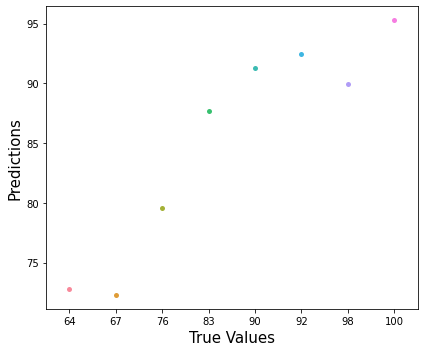

In [187]:
plt.figure(figsize=(6,5))
y_pred=Final_mod.predict(X_test)
sns.swarmplot(Y_test.round(2), y_pred)
print('True Values Vs Predicted Value plot:')
plt.xlabel('True Values' , fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.tight_layout()

# Saving model

In [188]:
import joblib
joblib.dump(Final_mod,'Baseballn.pkl')

['Baseballn.pkl']